In [1]:
# ============================================================
# RETINA-XAI
# LESION SEGMENTATION
# ============================================================

import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path
from PIL import Image

print("Libraries imported successfully!")

Libraries imported successfully!


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("Using device:", device)

PyTorch version: 2.14.0+cpu
CUDA available: False
Using device: cpu


In [3]:
# ============================================================
# PROJECT PATHS
# ============================================================

PROJECT_ROOT = Path(
    r"C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening"
)

SEG_ROOT = PROJECT_ROOT / "Disease Dataset" / "A. Segmentation"

TRAIN_IMAGES = (
    SEG_ROOT
    / "1. Original Images"
    / "a. Training Set"
)

TEST_IMAGES = (
    SEG_ROOT
    / "1. Original Images"
    / "b. Testing Set"
)

TRAIN_MASKS = (
    SEG_ROOT
    / "2. All Segmentation Groundtruths"
    / "a. Training Set"
)

TEST_MASKS = (
    SEG_ROOT
    / "2. All Segmentation Groundtruths"
    / "b. Testing Set"
)

print("Project root:")
print(PROJECT_ROOT)

print("\nSegmentation root:")
print(SEG_ROOT)

Project root:
C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening

Segmentation root:
C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening\Disease Dataset\A. Segmentation


In [4]:
# ============================================================
# VERIFY DATASET PATHS
# ============================================================

paths = {
    "TRAIN_IMAGES": TRAIN_IMAGES,
    "TEST_IMAGES": TEST_IMAGES,
    "TRAIN_MASKS": TRAIN_MASKS,
    "TEST_MASKS": TEST_MASKS
}

for name, path in paths.items():
    print(
        f"{name}:",
        "✓ EXISTS" if path.exists() else "✗ NOT FOUND"
    )

TRAIN_IMAGES: ✓ EXISTS
TEST_IMAGES: ✓ EXISTS
TRAIN_MASKS: ✓ EXISTS
TEST_MASKS: ✓ EXISTS


In [5]:
# ============================================================
# COUNT ORIGINAL IMAGES
# ============================================================

train_images = sorted([
    f for f in TRAIN_IMAGES.iterdir()
    if f.is_file()
])

test_images = sorted([
    f for f in TEST_IMAGES.iterdir()
    if f.is_file()
])

print("Training images:", len(train_images))
print("Testing images :", len(test_images))

Training images: 54
Testing images : 27


In [6]:
# ============================================================
# INSPECT SEGMENTATION MASKS
# ============================================================

train_mask_files = sorted([
    f for f in TRAIN_MASKS.iterdir()
    if f.is_file()
])

test_mask_files = sorted([
    f for f in TEST_MASKS.iterdir()
    if f.is_file()
])

print("Training mask files:", len(train_mask_files))
print("Testing mask files :", len(test_mask_files))

print("\nFirst 30 training mask files:")

for f in train_mask_files[:30]:
    print(f.name)

Training mask files: 0
Testing mask files : 0

First 30 training mask files:


In [7]:
# ============================================================
# STEP 7 — FIND ALL MASK FILES RECURSIVELY
# ============================================================

all_train_mask_files = [
    f for f in TRAIN_MASKS.rglob("*")
    if f.is_file()
]

all_test_mask_files = [
    f for f in TEST_MASKS.rglob("*")
    if f.is_file()
]

print("Total training mask files:", len(all_train_mask_files))
print("Total testing mask files :", len(all_test_mask_files))

print("\nFirst 50 TRAINING mask files:")
for f in all_train_mask_files[:50]:
    print(f.relative_to(TRAIN_MASKS))

Total training mask files: 241
Total testing mask files : 122

First 50 TRAINING mask files:
1. Microaneurysms\IDRiD_01_MA.tif
1. Microaneurysms\IDRiD_02_MA.tif
1. Microaneurysms\IDRiD_03_MA.tif
1. Microaneurysms\IDRiD_04_MA.tif
1. Microaneurysms\IDRiD_05_MA.tif
1. Microaneurysms\IDRiD_06_MA.tif
1. Microaneurysms\IDRiD_07_MA.tif
1. Microaneurysms\IDRiD_08_MA.tif
1. Microaneurysms\IDRiD_09_MA.tif
1. Microaneurysms\IDRiD_10_MA.tif
1. Microaneurysms\IDRiD_11_MA.tif
1. Microaneurysms\IDRiD_12_MA.tif
1. Microaneurysms\IDRiD_13_MA.tif
1. Microaneurysms\IDRiD_14_MA.tif
1. Microaneurysms\IDRiD_15_MA.tif
1. Microaneurysms\IDRiD_16_MA.tif
1. Microaneurysms\IDRiD_17_MA.tif
1. Microaneurysms\IDRiD_18_MA.tif
1. Microaneurysms\IDRiD_19_MA.tif
1. Microaneurysms\IDRiD_20_MA.tif
1. Microaneurysms\IDRiD_21_MA.tif
1. Microaneurysms\IDRiD_22_MA.tif
1. Microaneurysms\IDRiD_23_MA.tif
1. Microaneurysms\IDRiD_24_MA.tif
1. Microaneurysms\IDRiD_25_MA.tif
1. Microaneurysms\IDRiD_26_MA.tif
1. Microaneurysms\IDRiD

In [8]:
# ============================================================
# STEP 9 — INSPECT LESION TYPES
# ============================================================

for folder in sorted(TRAIN_MASKS.iterdir()):
    if folder.is_dir():

        files = [
            f for f in folder.iterdir()
            if f.is_file()
        ]

        print(f"\n{folder.name}")
        print("Number of files:", len(files))

        for f in files[:5]:
            print("  ", f.name)


1. Microaneurysms
Number of files: 54
   IDRiD_01_MA.tif
   IDRiD_02_MA.tif
   IDRiD_03_MA.tif
   IDRiD_04_MA.tif
   IDRiD_05_MA.tif

2. Haemorrhages
Number of files: 53
   IDRiD_01_HE.tif
   IDRiD_02_HE.tif
   IDRiD_03_HE.tif
   IDRiD_04_HE.tif
   IDRiD_05_HE.tif

3. Hard Exudates
Number of files: 54
   IDRiD_01_EX.tif
   IDRiD_02_EX.tif
   IDRiD_03_EX.tif
   IDRiD_04_EX.tif
   IDRiD_05_EX.tif

4. Soft Exudates
Number of files: 26
   IDRiD_03_SE.tif
   IDRiD_08_SE.tif
   IDRiD_13_SE.tif
   IDRiD_14_SE.tif
   IDRiD_17_SE.tif

5. Optic Disc
Number of files: 54
   IDRiD_01_OD.tif
   IDRiD_02_OD.tif
   IDRiD_03_OD.tif
   IDRiD_04_OD.tif
   IDRiD_05_OD.tif


In [9]:
# ============================================================
# STEP 10 — VISUALIZE IDRiD IMAGE + LESION MASKS
# ============================================================

sample_id = "01"

# Find original image
image_candidates = list(TRAIN_IMAGES.glob(f"IDRiD_{sample_id}.*"))

if not image_candidates:
    raise FileNotFoundError(
        f"Could not find original image for IDRiD_{sample_id}"
    )

image_path = image_candidates[0]

# Load original image
image = cv2.imread(str(image_path))
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

print("Image:", image_path.name)
print("Image shape:", image.shape)

Image: IDRiD_01.jpg
Image shape: (2848, 4288, 3)


In [10]:
# ============================================================
# STEP 10 — LOAD LESION MASKS
# ============================================================

sample_id = "01"

def find_mask(folder_name, suffix, sample_id):
    folder = TRAIN_MASKS / folder_name

    matches = list(
        folder.glob(f"IDRiD_{sample_id}_{suffix}.tif")
    )

    if matches:
        mask = cv2.imread(
            str(matches[0]),
            cv2.IMREAD_GRAYSCALE
        )
        return mask

    return np.zeros(image.shape[:2], dtype=np.uint8)


ma_mask = find_mask("1. Microaneurysms", "MA", sample_id)
he_mask = find_mask("2. Haemorrhages", "HE", sample_id)
ex_mask = find_mask("3. Hard Exudates", "EX", sample_id)
se_mask = find_mask("4. Soft Exudates", "SE", sample_id)
od_mask = find_mask("5. Optic Disc", "OD", sample_id)

print("MA mask:", ma_mask.shape)
print("HE mask:", he_mask.shape)
print("EX mask:", ex_mask.shape)
print("SE mask:", se_mask.shape)
print("OD mask:", od_mask.shape)

MA mask: (2848, 4288)
HE mask: (2848, 4288)
EX mask: (2848, 4288)
SE mask: (2848, 4288)
OD mask: (2848, 4288)


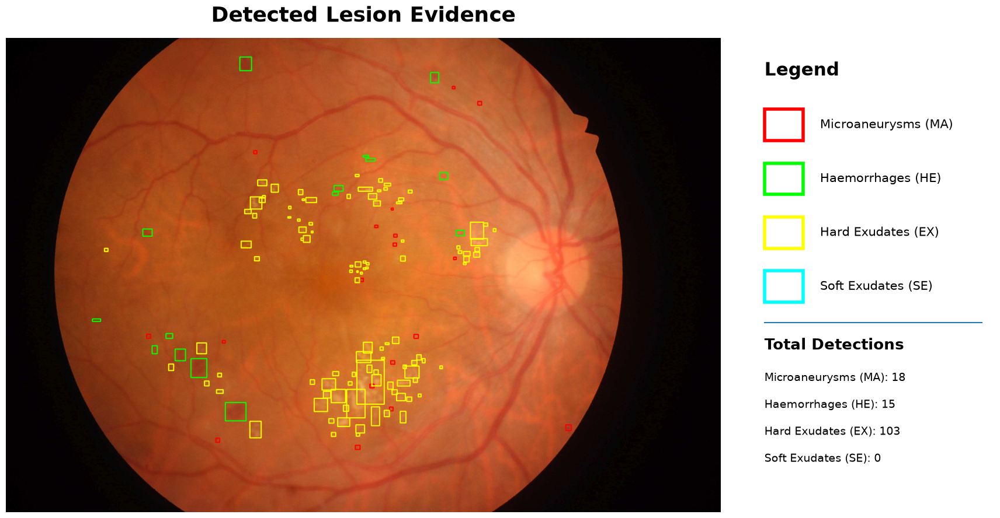

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


# ---------------------------------------------------------
# Find bounding boxes from mask
# ---------------------------------------------------------
def get_boxes(mask, min_area=20):

    mask_binary = (mask > 0).astype(np.uint8) * 255

    contours, _ = cv2.findContours(
        mask_binary,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    boxes = []

    for contour in contours:

        area = cv2.contourArea(contour)

        if area >= min_area:

            x, y, w, h = cv2.boundingRect(contour)

            boxes.append((x, y, w, h))

    return boxes


# ---------------------------------------------------------
# IMPORTANT:
# image is ALREADY RGB
# ---------------------------------------------------------
display_img = image.copy()


# ---------------------------------------------------------
# Colors
# ---------------------------------------------------------
COLORS = {
    "MA": (255, 0, 0),       # Red
    "HE": (0, 255, 0),       # Green
    "EX": (255, 255, 0),     # Yellow
    "SE": (0, 255, 255)      # Cyan
}


# ---------------------------------------------------------
# Get lesion bounding boxes
# ---------------------------------------------------------
ma_boxes = get_boxes(ma_mask, min_area=20)
he_boxes = get_boxes(he_mask, min_area=50)
ex_boxes = get_boxes(ex_mask, min_area=50)
se_boxes = get_boxes(se_mask, min_area=50)


# ---------------------------------------------------------
# Draw boxes
# ---------------------------------------------------------
def draw_boxes(img, boxes, color):

    for x, y, w, h in boxes:

        cv2.rectangle(
            img,
            (x, y),
            (x + w, y + h),
            color,
            5
        )


draw_boxes(display_img, ma_boxes, COLORS["MA"])
draw_boxes(display_img, he_boxes, COLORS["HE"])
draw_boxes(display_img, ex_boxes, COLORS["EX"])
draw_boxes(display_img, se_boxes, COLORS["SE"])


# ---------------------------------------------------------
# Figure
# ---------------------------------------------------------
fig = plt.figure(figsize=(18, 11))


# ---------------------------------------------------------
# Retina image
# ---------------------------------------------------------
ax = fig.add_axes([0.03, 0.08, 0.68, 0.82])

ax.imshow(display_img)

ax.set_title(
    "Detected Lesion Evidence",
    fontsize=26,
    fontweight="bold",
    pad=20
)

ax.axis("off")


# ---------------------------------------------------------
# Legend
# ---------------------------------------------------------
legend_ax = fig.add_axes([0.74, 0.15, 0.23, 0.70])

legend_ax.set_facecolor("white")

legend_ax.set_xlim(0, 1)
legend_ax.set_ylim(0, 1)

legend_ax.axis("off")


legend_ax.text(
    0.05,
    0.93,
    "Legend",
    fontsize=22,
    fontweight="bold"
)


# ---------------------------------------------------------
# Legend helper
# ---------------------------------------------------------
def legend_item(ax, y, color, text):

    rect = plt.Rectangle(
        (0.05, y - 0.035),
        0.16,
        0.07,
        fill=False,
        edgecolor=np.array(color) / 255,
        linewidth=4
    )

    ax.add_patch(rect)

    ax.text(
        0.28,
        y,
        text,
        fontsize=15,
        verticalalignment="center"
    )


legend_item(
    legend_ax,
    0.82,
    COLORS["MA"],
    "Microaneurysms (MA)"
)

legend_item(
    legend_ax,
    0.70,
    COLORS["HE"],
    "Haemorrhages (HE)"
)

legend_item(
    legend_ax,
    0.58,
    COLORS["EX"],
    "Hard Exudates (EX)"
)

legend_item(
    legend_ax,
    0.46,
    COLORS["SE"],
    "Soft Exudates (SE)"
)


# ---------------------------------------------------------
# Detection counts
# ---------------------------------------------------------
legend_ax.axhline(
    0.38,
    xmin=0.05,
    xmax=0.95,
    linewidth=1.5
)

legend_ax.text(
    0.05,
    0.32,
    "Total Detections",
    fontsize=19,
    fontweight="bold"
)

legend_ax.text(
    0.05,
    0.25,
    f"Microaneurysms (MA): {len(ma_boxes)}",
    fontsize=14
)

legend_ax.text(
    0.05,
    0.19,
    f"Haemorrhages (HE): {len(he_boxes)}",
    fontsize=14
)

legend_ax.text(
    0.05,
    0.13,
    f"Hard Exudates (EX): {len(ex_boxes)}",
    fontsize=14
)

legend_ax.text(
    0.05,
    0.07,
    f"Soft Exudates (SE): {len(se_boxes)}",
    fontsize=14
)


plt.show()

Detected Lesions
-----------------------------
Microaneurysms (MA): 18
Haemorrhages (HE): 13
Hard Exudates (EX): 46
Soft Exudates (SE): 0


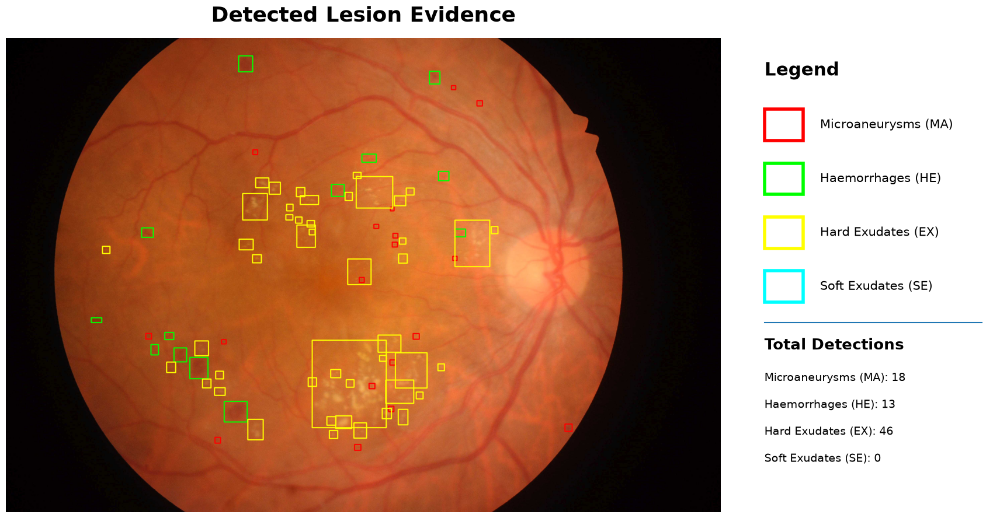

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


# =========================================================
# 1. FIND LESION REGIONS AND MERGE NEARBY REGIONS
# =========================================================
def get_boxes(mask, min_area=20, dilation_size=15):

    # Convert mask to binary
    binary = (mask > 0).astype(np.uint8) * 255

    # Kernel used to merge nearby lesion regions
    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (dilation_size, dilation_size)
    )

    # Merge nearby regions
    merged = cv2.dilate(
        binary,
        kernel,
        iterations=1
    )

    # Find connected regions
    contours, _ = cv2.findContours(
        merged,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    boxes = []

    for contour in contours:

        area = cv2.contourArea(contour)

        if area >= min_area:

            x, y, w, h = cv2.boundingRect(contour)

            boxes.append((x, y, w, h))

    return boxes


# =========================================================
# 2. KEEP ORIGINAL RETINA COLOR
# =========================================================
# IMPORTANT:
# Your 'image' is already RGB.
# DO NOT use cv2.cvtColor() here.

display_img = image.copy()


# =========================================================
# 3. COLORS
# =========================================================

COLORS = {
    "MA": (255, 0, 0),       # Red
    "HE": (0, 255, 0),       # Green
    "EX": (255, 255, 0),     # Yellow
    "SE": (0, 255, 255)      # Cyan
}


# =========================================================
# 4. GET LESION BOXES
# =========================================================

# Microaneurysms
ma_boxes = get_boxes(
    ma_mask,
    min_area=20,
    dilation_size=11
)

# Haemorrhages
he_boxes = get_boxes(
    he_mask,
    min_area=50,
    dilation_size=15
)

# Hard Exudates
ex_boxes = get_boxes(
    ex_mask,
    min_area=50,
    dilation_size=25
)

# Soft Exudates
se_boxes = get_boxes(
    se_mask,
    min_area=50,
    dilation_size=20
)


# =========================================================
# 5. PRINT NUMBER OF DETECTIONS
# =========================================================

print("Detected Lesions")
print("-----------------------------")
print("Microaneurysms (MA):", len(ma_boxes))
print("Haemorrhages (HE):", len(he_boxes))
print("Hard Exudates (EX):", len(ex_boxes))
print("Soft Exudates (SE):", len(se_boxes))


# =========================================================
# 6. DRAW BOXES
# =========================================================

def draw_boxes(img, boxes, color):

    for x, y, w, h in boxes:

        cv2.rectangle(
            img,
            (x, y),
            (x + w, y + h),
            color,
            5
        )


# Draw all lesion types
draw_boxes(
    display_img,
    ma_boxes,
    COLORS["MA"]
)

draw_boxes(
    display_img,
    he_boxes,
    COLORS["HE"]
)

draw_boxes(
    display_img,
    ex_boxes,
    COLORS["EX"]
)

draw_boxes(
    display_img,
    se_boxes,
    COLORS["SE"]
)


# =========================================================
# 7. CREATE FIGURE
# =========================================================

fig = plt.figure(figsize=(18, 11))


# =========================================================
# 8. RETINA IMAGE
# =========================================================

ax = fig.add_axes(
    [0.03, 0.08, 0.68, 0.82]
)

ax.imshow(display_img)

ax.set_title(
    "Detected Lesion Evidence",
    fontsize=26,
    fontweight="bold",
    pad=20
)

ax.axis("off")


# =========================================================
# 9. LEGEND PANEL
# =========================================================

legend_ax = fig.add_axes(
    [0.74, 0.15, 0.23, 0.70]
)

legend_ax.set_facecolor("white")

legend_ax.set_xlim(0, 1)
legend_ax.set_ylim(0, 1)

legend_ax.axis("off")


# =========================================================
# 10. LEGEND TITLE
# =========================================================

legend_ax.text(
    0.05,
    0.93,
    "Legend",
    fontsize=22,
    fontweight="bold"
)


# =========================================================
# 11. LEGEND ITEM FUNCTION
# =========================================================

def legend_item(ax, y, color, text):

    rect = plt.Rectangle(
        (0.05, y - 0.035),
        0.16,
        0.07,
        fill=False,
        edgecolor=np.array(color) / 255,
        linewidth=4
    )

    ax.add_patch(rect)

    ax.text(
        0.28,
        y,
        text,
        fontsize=15,
        verticalalignment="center"
    )


# =========================================================
# 12. LEGEND
# =========================================================

legend_item(
    legend_ax,
    0.82,
    COLORS["MA"],
    "Microaneurysms (MA)"
)

legend_item(
    legend_ax,
    0.70,
    COLORS["HE"],
    "Haemorrhages (HE)"
)

legend_item(
    legend_ax,
    0.58,
    COLORS["EX"],
    "Hard Exudates (EX)"
)

legend_item(
    legend_ax,
    0.46,
    COLORS["SE"],
    "Soft Exudates (SE)"
)


# =========================================================
# 13. SEPARATOR
# =========================================================

legend_ax.axhline(
    0.38,
    xmin=0.05,
    xmax=0.95,
    linewidth=1.5
)


# =========================================================
# 14. TOTAL DETECTIONS
# =========================================================

legend_ax.text(
    0.05,
    0.32,
    "Total Detections",
    fontsize=19,
    fontweight="bold"
)


legend_ax.text(
    0.05,
    0.25,
    f"Microaneurysms (MA): {len(ma_boxes)}",
    fontsize=14
)

legend_ax.text(
    0.05,
    0.19,
    f"Haemorrhages (HE): {len(he_boxes)}",
    fontsize=14
)

legend_ax.text(
    0.05,
    0.13,
    f"Hard Exudates (EX): {len(ex_boxes)}",
    fontsize=14
)

legend_ax.text(
    0.05,
    0.07,
    f"Soft Exudates (SE): {len(se_boxes)}",
    fontsize=14
)


# =========================================================
# 15. DISPLAY
# =========================================================

plt.show()

In [20]:
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# CREATE MULTI-CLASS SEGMENTATION MASK
# =========================================================

combined_mask = np.zeros(ma_mask.shape, dtype=np.uint8)

# Microaneurysm
combined_mask[ma_mask > 0] = 1

# Haemorrhage
combined_mask[he_mask > 0] = 2

# Hard Exudate
combined_mask[ex_mask > 0] = 3

# Soft Exudate
combined_mask[se_mask > 0] = 4


# =========================================================
# CHECK PIXEL CLASSES
# =========================================================

classes, counts = np.unique(
    combined_mask,
    return_counts=True
)

print("Class distribution in this image:")

for cls, count in zip(classes, counts):

    if cls == 0:
        name = "Background"
    elif cls == 1:
        name = "Microaneurysm"
    elif cls == 2:
        name = "Haemorrhage"
    elif cls == 3:
        name = "Hard Exudate"
    elif cls == 4:
        name = "Soft Exudate"

    print(f"{cls} - {name}: {count} pixels")

Class distribution in this image:
0 - Background: 12056567 pixels
1 - Microaneurysm: 6941 pixels
2 - Haemorrhage: 35430 pixels
3 - Hard Exudate: 113286 pixels


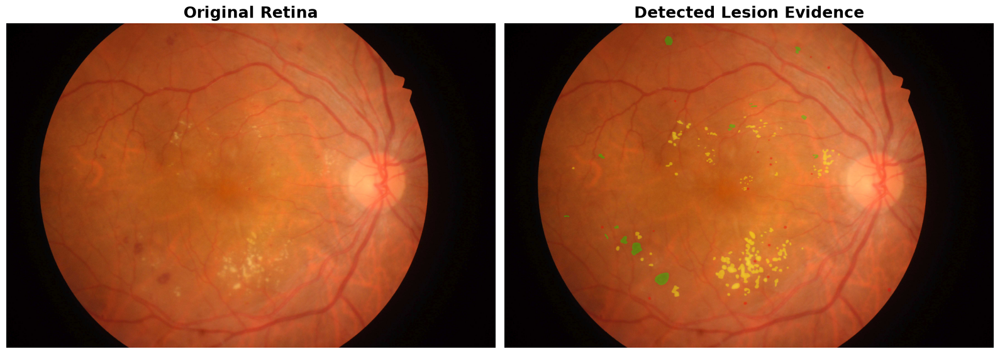

In [22]:
# =========================================================
# ORIGINAL RETINA + LESION EVIDENCE ONLY
# =========================================================

# Keep original natural retina color
overlay = image.copy()

# Colors
COLORS = {
    1: (255, 0, 0),      # MA - Red
    2: (0, 255, 0),      # HE - Green
    3: (255, 255, 0),    # EX - Yellow
    4: (0, 255, 255)     # SE - Cyan
}

# Draw colored lesion pixels on original image
for class_id, color in COLORS.items():

    region = combined_mask == class_id

    overlay[region] = (
        0.65 * overlay[region] +
        0.35 * np.array(color)
    ).astype(np.uint8)


# =========================================================
# DISPLAY ONLY 2 IMAGES
# =========================================================

fig, axes = plt.subplots(
    1, 2,
    figsize=(16, 7)
)

# Original Retina
axes[0].imshow(image)
axes[0].set_title(
    "Original Retina",
    fontsize=18,
    fontweight="bold"
)
axes[0].axis("off")


# Lesion Evidence
axes[1].imshow(overlay)
axes[1].set_title(
    "Detected Lesion Evidence",
    fontsize=18,
    fontweight="bold"
)
axes[1].axis("off")


plt.tight_layout()
plt.show()

In [23]:
# =========================================================
# STEP 5 - CREATE PYTORCH DATASET
# =========================================================

import os
import cv2
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader


# ---------------------------------------------------------
# Dataset paths
# ---------------------------------------------------------

IMAGE_DIR = TRAIN_IMAGES
MA_DIR = TRAIN_MASKS / "1. Microaneurysms"
HE_DIR = TRAIN_MASKS / "2. Haemorrhages"
EX_DIR = TRAIN_MASKS / "3. Hard Exudates"
SE_DIR = TRAIN_MASKS / "4. Soft Exudates"


# ---------------------------------------------------------
# Get all training images
# ---------------------------------------------------------

image_paths = sorted(
    IMAGE_DIR.glob("*.jpg")
)

print("Total training images:", len(image_paths))


# ---------------------------------------------------------
# Function to load a lesion mask
# ---------------------------------------------------------

def load_mask(mask_dir, sample_id, suffix, height, width):

    mask_path = mask_dir / f"IDRiD_{sample_id}_{suffix}.tif"

    if mask_path.exists():

        mask = cv2.imread(
            str(mask_path),
            cv2.IMREAD_GRAYSCALE
        )

        return mask

    # If lesion does not exist in this image
    return np.zeros(
        (height, width),
        dtype=np.uint8
    )


# ---------------------------------------------------------
# Create combined 5-class mask
# ---------------------------------------------------------

def create_combined_mask(sample_id, height, width):

    combined = np.zeros(
        (height, width),
        dtype=np.uint8
    )

    # MA = 1
    ma = load_mask(
        MA_DIR,
        sample_id,
        "MA",
        height,
        width
    )

    combined[ma > 0] = 1


    # HE = 2
    he = load_mask(
        HE_DIR,
        sample_id,
        "HE",
        height,
        width
    )

    combined[he > 0] = 2


    # EX = 3
    ex = load_mask(
        EX_DIR,
        sample_id,
        "EX",
        height,
        width
    )

    combined[ex > 0] = 3


    # SE = 4
    se = load_mask(
        SE_DIR,
        sample_id,
        "SE",
        height,
        width
    )

    combined[se > 0] = 4


    return combined


# ---------------------------------------------------------
# PyTorch Dataset
# ---------------------------------------------------------

class IDRiDLesionDataset(Dataset):

    def __init__(self, image_paths, image_size=512):

        self.image_paths = image_paths
        self.image_size = image_size


    def __len__(self):

        return len(self.image_paths)


    def __getitem__(self, idx):

        image_path = self.image_paths[idx]

        # ---------------------------------------------
        # Sample ID
        # ---------------------------------------------

        filename = image_path.stem
        sample_id = filename.split("_")[-1]


        # ---------------------------------------------
        # Read image
        # ---------------------------------------------

        image = cv2.imread(
            str(image_path)
        )

        image = cv2.cvtColor(
            image,
            cv2.COLOR_BGR2RGB
        )


        original_h, original_w = image.shape[:2]


        # ---------------------------------------------
        # Create full-resolution mask
        # ---------------------------------------------

        mask = create_combined_mask(
            sample_id,
            original_h,
            original_w
        )


        # ---------------------------------------------
        # Resize image
        # ---------------------------------------------

        image = cv2.resize(
            image,
            (self.image_size, self.image_size),
            interpolation=cv2.INTER_AREA
        )


        # ---------------------------------------------
        # Resize mask
        # IMPORTANT: NEAREST interpolation
        # ---------------------------------------------

        mask = cv2.resize(
            mask,
            (self.image_size, self.image_size),
            interpolation=cv2.INTER_NEAREST
        )


        # ---------------------------------------------
        # Convert image to PyTorch format
        # HWC → CHW
        # ---------------------------------------------

        image = image.astype(np.float32) / 255.0

        image = np.transpose(
            image,
            (2, 0, 1)
        )


        # ---------------------------------------------
        # Convert to tensors
        # ---------------------------------------------

        image = torch.tensor(
            image,
            dtype=torch.float32
        )

        mask = torch.tensor(
            mask,
            dtype=torch.long
        )


        return image, mask


# =========================================================
# CREATE DATASET
# =========================================================

dataset = IDRiDLesionDataset(
    image_paths,
    image_size=512
)


print("Dataset size:", len(dataset))


# =========================================================
# TEST ONE SAMPLE
# =========================================================

sample_image, sample_mask = dataset[0]

print()
print("Image shape:", sample_image.shape)
print("Mask shape :", sample_mask.shape)
print("Image dtype:", sample_image.dtype)
print("Mask dtype :", sample_mask.dtype)

print()
print("Mask classes:", torch.unique(sample_mask))

Total training images: 54
Dataset size: 54

Image shape: torch.Size([3, 512, 512])
Mask shape : torch.Size([512, 512])
Image dtype: torch.float32
Mask dtype : torch.int64

Mask classes: tensor([0, 1, 2, 3])


In [24]:
# =========================================================
# STEP 6 - TRAIN / VALIDATION SPLIT
# =========================================================

from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader


# ---------------------------------------------------------
# Split image paths
# ---------------------------------------------------------

train_paths, val_paths = train_test_split(
    image_paths,
    test_size=0.20,
    random_state=42
)


print("Total images      :", len(image_paths))
print("Training images   :", len(train_paths))
print("Validation images :", len(val_paths))


# =========================================================
# CREATE DATASETS
# =========================================================

train_dataset = IDRiDLesionDataset(
    train_paths,
    image_size=512
)

val_dataset = IDRiDLesionDataset(
    val_paths,
    image_size=512
)


# =========================================================
# CREATE DATALOADERS
# =========================================================

train_loader = DataLoader(
    train_dataset,
    batch_size=2,
    shuffle=True,
    num_workers=0
)

val_loader = DataLoader(
    val_dataset,
    batch_size=2,
    shuffle=False,
    num_workers=0
)


# =========================================================
# CHECK BATCH
# =========================================================

images, masks = next(iter(train_loader))

print()
print("Batch image shape :", images.shape)
print("Batch mask shape  :", masks.shape)
print("Mask classes      :", torch.unique(masks))

Total images      : 54
Training images   : 43
Validation images : 11

Batch image shape : torch.Size([2, 3, 512, 512])
Batch mask shape  : torch.Size([2, 512, 512])
Mask classes      : tensor([0, 1, 2, 3, 4])


In [25]:
# =========================================================
# STEP 7 - U-NET MODEL
# =========================================================

import torch
import torch.nn as nn


# =========================================================
# DOUBLE CONVOLUTION BLOCK
# =========================================================

class DoubleConv(nn.Module):

    def __init__(self, in_channels, out_channels):

        super().__init__()

        self.block = nn.Sequential(

            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size=3,
                padding=1
            ),

            nn.BatchNorm2d(out_channels),

            nn.ReLU(inplace=True),

            nn.Conv2d(
                out_channels,
                out_channels,
                kernel_size=3,
                padding=1
            ),

            nn.BatchNorm2d(out_channels),

            nn.ReLU(inplace=True)
        )


    def forward(self, x):

        return self.block(x)


# =========================================================
# U-NET
# =========================================================

class UNet(nn.Module):

    def __init__(self, num_classes=5):

        super().__init__()


        # -------------------------------------------------
        # Encoder
        # -------------------------------------------------

        self.enc1 = DoubleConv(3, 32)

        self.enc2 = DoubleConv(32, 64)

        self.enc3 = DoubleConv(64, 128)

        self.enc4 = DoubleConv(128, 256)


        # -------------------------------------------------
        # Bottleneck
        # -------------------------------------------------

        self.bottleneck = DoubleConv(
            256,
            512
        )


        # -------------------------------------------------
        # Pooling
        # -------------------------------------------------

        self.pool = nn.MaxPool2d(
            kernel_size=2,
            stride=2
        )


        # -------------------------------------------------
        # Decoder
        # -------------------------------------------------

        self.up4 = nn.ConvTranspose2d(
            512,
            256,
            kernel_size=2,
            stride=2
        )

        self.dec4 = DoubleConv(
            512,
            256
        )


        self.up3 = nn.ConvTranspose2d(
            256,
            128,
            kernel_size=2,
            stride=2
        )

        self.dec3 = DoubleConv(
            256,
            128
        )


        self.up2 = nn.ConvTranspose2d(
            128,
            64,
            kernel_size=2,
            stride=2
        )

        self.dec2 = DoubleConv(
            128,
            64
        )


        self.up1 = nn.ConvTranspose2d(
            64,
            32,
            kernel_size=2,
            stride=2
        )

        self.dec1 = DoubleConv(
            64,
            32
        )


        # -------------------------------------------------
        # Final segmentation layer
        # -------------------------------------------------

        self.final = nn.Conv2d(
            32,
            num_classes,
            kernel_size=1
        )


    def forward(self, x):

        # =================================================
        # ENCODER
        # =================================================

        e1 = self.enc1(x)

        e2 = self.enc2(
            self.pool(e1)
        )

        e3 = self.enc3(
            self.pool(e2)
        )

        e4 = self.enc4(
            self.pool(e3)
        )


        # =================================================
        # BOTTLENECK
        # =================================================

        b = self.bottleneck(
            self.pool(e4)
        )


        # =================================================
        # DECODER
        # =================================================

        d4 = self.up4(b)

        d4 = torch.cat(
            [d4, e4],
            dim=1
        )

        d4 = self.dec4(d4)


        d3 = self.up3(d4)

        d3 = torch.cat(
            [d3, e3],
            dim=1
        )

        d3 = self.dec3(d3)


        d2 = self.up2(d3)

        d2 = torch.cat(
            [d2, e2],
            dim=1
        )

        d2 = self.dec2(d2)


        d1 = self.up1(d2)

        d1 = torch.cat(
            [d1, e1],
            dim=1
        )

        d1 = self.dec1(d1)


        # =================================================
        # OUTPUT
        # =================================================

        output = self.final(d1)

        return output

In [26]:
# =========================================================
# TEST U-NET
# =========================================================

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("Device:", device)


model = UNet(
    num_classes=5
).to(device)


# Take one batch
images, masks = next(iter(train_loader))

images = images.to(device)


# Forward pass
with torch.no_grad():

    outputs = model(images)


print("Input shape :", images.shape)
print("Output shape:", outputs.shape)

Device: cpu
Input shape : torch.Size([2, 3, 512, 512])
Output shape: torch.Size([2, 5, 512, 512])


In [27]:
# =========================================================
# STEP 9 - LOSS FUNCTION + OPTIMIZER
# =========================================================

import torch.nn as nn
import torch.optim as optim


# ---------------------------------------------------------
# Cross Entropy Loss
# ---------------------------------------------------------

criterion = nn.CrossEntropyLoss()


# ---------------------------------------------------------
# Optimizer
# ---------------------------------------------------------

optimizer = optim.Adam(
    model.parameters(),
    lr=1e-4
)


print("Loss function :", criterion)
print("Optimizer     :", optimizer)

Loss function : CrossEntropyLoss()
Optimizer     : Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


In [29]:
import time

NUM_EPOCHS = 10

for epoch in range(NUM_EPOCHS):

    start_time = time.time()

    model.train()
    train_loss = 0.0

    for images, masks in train_loader:

        images = images.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()

        outputs = model(images)

        loss = criterion(outputs, masks)

        loss.backward()

        optimizer.step()

        train_loss += loss.item()

    train_loss /= len(train_loader)

    model.eval()
    val_loss = 0.0

    with torch.no_grad():

        for images, masks in val_loader:

            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)

            loss = criterion(outputs, masks)

            val_loss += loss.item()

    val_loss /= len(val_loader)

    elapsed = time.time() - start_time

    print(
        f"Epoch [{epoch + 1}/{NUM_EPOCHS}] "
        f"Train Loss: {train_loss:.4f} "
        f"Val Loss: {val_loss:.4f} "
        f"Time: {elapsed:.1f}s"
    )

Epoch [1/10] Train Loss: 1.7075 Val Loss: 1.7349 Time: 63.4s
Epoch [2/10] Train Loss: 1.4407 Val Loss: 1.4463 Time: 62.2s
Epoch [3/10] Train Loss: 1.3102 Val Loss: 1.2352 Time: 61.8s
Epoch [4/10] Train Loss: 1.2500 Val Loss: 1.2005 Time: 61.8s
Epoch [5/10] Train Loss: 1.2147 Val Loss: 1.1925 Time: 61.4s
Epoch [6/10] Train Loss: 1.1644 Val Loss: 1.1430 Time: 61.3s
Epoch [7/10] Train Loss: 1.1233 Val Loss: 1.1179 Time: 60.3s
Epoch [9/10] Train Loss: 1.0584 Val Loss: 1.0456 Time: 61.1s
Epoch [10/10] Train Loss: 1.0278 Val Loss: 1.0378 Time: 62.0s


In [30]:
# =========================================================
# STEP 11 - SEGMENTATION EVALUATION
# =========================================================

import numpy as np
import torch


# ---------------------------------------------------------
# Dice Score
# ---------------------------------------------------------

def dice_score(pred, target, class_id):

    pred_class = (pred == class_id)
    target_class = (target == class_id)

    intersection = np.logical_and(
        pred_class,
        target_class
    ).sum()

    pred_sum = pred_class.sum()
    target_sum = target_class.sum()

    if pred_sum + target_sum == 0:
        return 1.0

    dice = (
        2.0 * intersection
        / (pred_sum + target_sum)
    )

    return dice


# ---------------------------------------------------------
# IoU Score
# ---------------------------------------------------------

def iou_score(pred, target, class_id):

    pred_class = (pred == class_id)
    target_class = (target == class_id)

    intersection = np.logical_and(
        pred_class,
        target_class
    ).sum()

    union = np.logical_or(
        pred_class,
        target_class
    ).sum()

    if union == 0:
        return 1.0

    return intersection / union


# =========================================================
# EVALUATE VALIDATION SET
# =========================================================

model.eval()

dice_scores = {
    1: [],
    2: [],
    3: [],
    4: []
}

iou_scores = {
    1: [],
    2: [],
    3: [],
    4: []
}


with torch.no_grad():

    for images, masks in val_loader:

        images = images.to(device)

        outputs = model(images)

        predictions = torch.argmax(
            outputs,
            dim=1
        )


        predictions = predictions.cpu().numpy()
        masks = masks.numpy()


        # ---------------------------------------------
        # Each image in batch
        # ---------------------------------------------

        for pred, target in zip(
            predictions,
            masks
        ):

            # MA
            dice_scores[1].append(
                dice_score(pred, target, 1)
            )

            iou_scores[1].append(
                iou_score(pred, target, 1)
            )


            # HE
            dice_scores[2].append(
                dice_score(pred, target, 2)
            )

            iou_scores[2].append(
                iou_score(pred, target, 2)
            )


            # EX
            dice_scores[3].append(
                dice_score(pred, target, 3)
            )

            iou_scores[3].append(
                iou_score(pred, target, 3)
            )


            # SE
            dice_scores[4].append(
                dice_score(pred, target, 4)
            )

            iou_scores[4].append(
                iou_score(pred, target, 4)
            )


# =========================================================
# PRINT RESULTS
# =========================================================

names = {
    1: "Microaneurysm (MA)",
    2: "Haemorrhage (HE)",
    3: "Hard Exudate (EX)",
    4: "Soft Exudate (SE)"
}


print("\nSegmentation Results")
print("=" * 55)

for class_id in range(1, 5):

    dice = np.mean(
        dice_scores[class_id]
    )

    iou = np.mean(
        iou_scores[class_id]
    )

    print(
        f"{names[class_id]:25s} "
        f"Dice: {dice:.4f}   "
        f"IoU: {iou:.4f}"
    )


# Overall
all_dice = []

all_iou = []

for class_id in range(1, 5):

    all_dice.extend(
        dice_scores[class_id]
    )

    all_iou.extend(
        iou_scores[class_id]
    )


print("=" * 55)

print(
    f"Mean Dice: {np.mean(all_dice):.4f}"
)

print(
    f"Mean IoU : {np.mean(all_iou):.4f}"
)


Segmentation Results
Microaneurysm (MA)        Dice: 0.0012   IoU: 0.0006
Haemorrhage (HE)          Dice: 0.0001   IoU: 0.0000
Hard Exudate (EX)         Dice: 0.0361   IoU: 0.0189
Soft Exudate (SE)         Dice: 0.0103   IoU: 0.0053
Mean Dice: 0.0119
Mean IoU : 0.0062


In [31]:
# =========================================================
# STEP 12 - DICE LOSS + CROSS ENTROPY
# =========================================================

import torch
import torch.nn as nn
import torch.nn.functional as F


class DiceLoss(nn.Module):

    def __init__(self, num_classes=5, smooth=1.0):

        super().__init__()

        self.num_classes = num_classes
        self.smooth = smooth


    def forward(self, logits, targets):

        # Convert logits to probabilities
        probabilities = F.softmax(
            logits,
            dim=1
        )

        total_loss = 0.0

        for class_id in range(self.num_classes):

            pred = probabilities[:, class_id]

            target = (
                targets == class_id
            ).float()


            # Flatten
            pred = pred.contiguous().view(-1)
            target = target.contiguous().view(-1)


            # Intersection
            intersection = (
                pred * target
            ).sum()


            # Dice
            dice = (
                2.0 * intersection
                + self.smooth
            ) / (
                pred.sum()
                + target.sum()
                + self.smooth
            )


            total_loss += (
                1.0 - dice
            )


        return total_loss / self.num_classes


# =========================================================
# COMBINED LOSS
# =========================================================

dice_loss = DiceLoss(
    num_classes=5
)

cross_entropy = nn.CrossEntropyLoss()


def combined_loss(logits, targets):

    ce = cross_entropy(
        logits,
        targets
    )

    dice = dice_loss(
        logits,
        targets
    )

    return ce + dice


# =========================================================
# OPTIMIZER
# =========================================================

optimizer = torch.optim.Adam(
    model.parameters(),
    lr=1e-4
)


print("Loss: Cross Entropy + Dice Loss")
print("Optimizer: Adam")
print("Learning rate: 1e-4")

Loss: Cross Entropy + Dice Loss
Optimizer: Adam
Learning rate: 1e-4


In [32]:
# =========================================================
# RESET U-NET
# =========================================================

model = UNet(
    num_classes=5
).to(device)

optimizer = torch.optim.Adam(
    model.parameters(),
    lr=1e-4
)

print("Fresh U-Net created.")

Fresh U-Net created.


In [33]:
import time

NUM_EPOCHS = 10

best_val_loss = float("inf")

for epoch in range(NUM_EPOCHS):

    start_time = time.time()

    # =========================
    # TRAINING
    # =========================
    model.train()

    train_loss = 0.0

    for images, masks in train_loader:

        images = images.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()

        outputs = model(images)

        loss = combined_loss(outputs, masks)

        loss.backward()

        optimizer.step()

        train_loss += loss.item()

    train_loss /= len(train_loader)


    # =========================
    # VALIDATION
    # =========================
    model.eval()

    val_loss = 0.0

    with torch.no_grad():

        for images, masks in val_loader:

            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)

            loss = combined_loss(outputs, masks)

            val_loss += loss.item()

    val_loss /= len(val_loader)


    # =========================
    # SAVE BEST MODEL
    # =========================
    if val_loss < best_val_loss:

        best_val_loss = val_loss

        torch.save(
            model.state_dict(),
            "retina_xai_unet_best.pth"
        )

        best_text = " ← BEST"

    else:
        best_text = ""


    elapsed = time.time() - start_time

    print(
        f"Epoch [{epoch + 1}/{NUM_EPOCHS}] "
        f"Train Loss: {train_loss:.4f} "
        f"Val Loss: {val_loss:.4f} "
        f"Time: {elapsed:.1f}s"
        f"{best_text}"
    )

Epoch [1/10] Train Loss: 2.3991 Val Loss: 2.5002 Time: 63.9s ← BEST
Epoch [2/10] Train Loss: 2.1598 Val Loss: 2.2092 Time: 61.7s ← BEST
Epoch [3/10] Train Loss: 2.0249 Val Loss: 1.9999 Time: 63.0s ← BEST
Epoch [4/10] Train Loss: 1.9392 Val Loss: 1.9241 Time: 61.8s ← BEST
Epoch [5/10] Train Loss: 1.8881 Val Loss: 1.9599 Time: 62.1s
Epoch [6/10] Train Loss: 1.8491 Val Loss: 2.0585 Time: 61.6s
Epoch [7/10] Train Loss: 1.8103 Val Loss: 1.8176 Time: 63.9s ← BEST
Epoch [8/10] Train Loss: 1.7797 Val Loss: 1.7980 Time: 59.8s ← BEST
Epoch [9/10] Train Loss: 1.7421 Val Loss: 1.7730 Time: 60.9s ← BEST
Epoch [10/10] Train Loss: 1.7079 Val Loss: 1.7843 Time: 60.5s


In [34]:
# =========================================================
# STEP 14 - LOAD BEST U-NET
# =========================================================

model.load_state_dict(
    torch.load(
        "retina_xai_unet_best.pth",
        map_location=device
    )
)

model = model.to(device)

model.eval()

print("Best U-Net loaded successfully.")

Best U-Net loaded successfully.


In [35]:
# =========================================================
# STEP 15 - DICE + IoU EVALUATION
# =========================================================

import numpy as np
import torch


def calculate_dice(pred, target, class_id):

    pred_class = (pred == class_id)
    target_class = (target == class_id)

    intersection = np.logical_and(
        pred_class,
        target_class
    ).sum()

    total = (
        pred_class.sum()
        + target_class.sum()
    )

    if total == 0:
        return 1.0

    return (2.0 * intersection) / total


def calculate_iou(pred, target, class_id):

    pred_class = (pred == class_id)
    target_class = (target == class_id)

    intersection = np.logical_and(
        pred_class,
        target_class
    ).sum()

    union = np.logical_or(
        pred_class,
        target_class
    ).sum()

    if union == 0:
        return 1.0

    return intersection / union


class_names = {
    1: "Microaneurysm (MA)",
    2: "Haemorrhage (HE)",
    3: "Hard Exudate (EX)",
    4: "Soft Exudate (SE)"
}


dice_results = {
    1: [],
    2: [],
    3: [],
    4: []
}

iou_results = {
    1: [],
    2: [],
    3: [],
    4: []
}


# =========================================================
# VALIDATION
# =========================================================

model.eval()

with torch.no_grad():

    for images, masks in val_loader:

        images = images.to(device)

        outputs = model(images)

        predictions = torch.argmax(
            outputs,
            dim=1
        )

        predictions = predictions.cpu().numpy()
        masks = masks.numpy()

        for pred, target in zip(
            predictions,
            masks
        ):

            for class_id in range(1, 5):

                dice_results[class_id].append(
                    calculate_dice(
                        pred,
                        target,
                        class_id
                    )
                )

                iou_results[class_id].append(
                    calculate_iou(
                        pred,
                        target,
                        class_id
                    )
                )


# =========================================================
# RESULTS
# =========================================================

print("\nSegmentation Results")
print("=" * 60)

for class_id in range(1, 5):

    dice = np.mean(dice_results[class_id])
    iou = np.mean(iou_results[class_id])

    print(
        f"{class_names[class_id]:25s}"
        f" Dice: {dice:.4f}"
        f"   IoU: {iou:.4f}"
    )


mean_dice = np.mean([
    np.mean(dice_results[c])
    for c in range(1, 5)
])

mean_iou = np.mean([
    np.mean(iou_results[c])
    for c in range(1, 5)
])


print("=" * 60)
print(f"Mean Dice: {mean_dice:.4f}")
print(f"Mean IoU : {mean_iou:.4f}")


Segmentation Results
Microaneurysm (MA)        Dice: 0.0000   IoU: 0.0000
Haemorrhage (HE)          Dice: 0.0007   IoU: 0.0003
Hard Exudate (EX)         Dice: 0.0000   IoU: 0.0000
Soft Exudate (SE)         Dice: 0.0015   IoU: 0.0008
Mean Dice: 0.0005
Mean IoU : 0.0003


In [36]:
# =========================================================
# STEP 16 - CHECK WHAT U-NET IS PREDICTING
# =========================================================

model.eval()

total_pixels = 0
class_counts = np.zeros(5, dtype=np.int64)

with torch.no_grad():

    for images, masks in val_loader:

        images = images.to(device)

        outputs = model(images)

        predictions = torch.argmax(
            outputs,
            dim=1
        )

        predictions = predictions.cpu().numpy()

        for pred in predictions:

            classes, counts = np.unique(
                pred,
                return_counts=True
            )

            for cls, count in zip(classes, counts):

                class_counts[cls] += count

                total_pixels += count


class_names = {
    0: "Background",
    1: "Microaneurysm (MA)",
    2: "Haemorrhage (HE)",
    3: "Hard Exudate (EX)",
    4: "Soft Exudate (SE)"
}


print("\nPredicted Pixel Distribution")
print("=" * 50)

for class_id in range(5):

    percentage = (
        class_counts[class_id]
        / total_pixels
    ) * 100

    print(
        f"{class_names[class_id]:25s}"
        f": {class_counts[class_id]:,}"
        f" pixels ({percentage:.2f}%)"
    )

print("=" * 50)


Predicted Pixel Distribution
Background               : 2,866,952 pixels (99.42%)
Microaneurysm (MA)       : 973 pixels (0.03%)
Haemorrhage (HE)         : 1,146 pixels (0.04%)
Hard Exudate (EX)        : 0 pixels (0.00%)
Soft Exudate (SE)        : 14,513 pixels (0.50%)


In [37]:
# =========================================================
# STEP 17 - CHECK TRAINING PIXEL DISTRIBUTION
# =========================================================

class_pixel_counts = np.zeros(5, dtype=np.int64)

print("Checking training masks...")

for i in range(len(train_dataset)):

    _, mask = train_dataset[i]

    mask = mask.numpy()

    classes, counts = np.unique(
        mask,
        return_counts=True
    )

    for cls, count in zip(classes, counts):
        class_pixel_counts[cls] += count


class_names = {
    0: "Background",
    1: "Microaneurysm (MA)",
    2: "Haemorrhage (HE)",
    3: "Hard Exudate (EX)",
    4: "Soft Exudate (SE)"
}


total = class_pixel_counts.sum()

print("\nTraining Pixel Distribution")
print("=" * 60)

for cls in range(5):

    percentage = (
        class_pixel_counts[cls] / total
    ) * 100

    print(
        f"{class_names[cls]:25s}"
        f": {class_pixel_counts[cls]:,}"
        f" pixels ({percentage:.4f}%)"
    )

print("=" * 60)

Checking training masks...

Training Pixel Distribution
Background               : 11,032,488 pixels (97.8735%)
Microaneurysm (MA)       : 10,656 pixels (0.0945%)
Haemorrhage (HE)         : 118,290 pixels (1.0494%)
Hard Exudate (EX)        : 88,593 pixels (0.7859%)
Soft Exudate (SE)        : 22,165 pixels (0.1966%)


In [38]:
# =========================================================
# STEP 18 - LESION-FOCUSED LOSS
# =========================================================

import torch
import torch.nn as nn
import torch.nn.functional as F


class LesionDiceLoss(nn.Module):

    def __init__(self, num_classes=5, smooth=1.0):

        super().__init__()

        self.num_classes = num_classes
        self.smooth = smooth


    def forward(self, logits, targets):

        probs = F.softmax(logits, dim=1)

        total_loss = 0.0

        # IMPORTANT:
        # Start from class 1.
        # Background (class 0) is excluded.

        for class_id in range(1, self.num_classes):

            pred = probs[:, class_id]

            target = (
                targets == class_id
            ).float()

            pred = pred.reshape(-1)
            target = target.reshape(-1)

            intersection = (
                pred * target
            ).sum()

            dice = (
                2 * intersection + self.smooth
            ) / (
                pred.sum()
                + target.sum()
                + self.smooth
            )

            total_loss += 1 - dice

        return total_loss / (self.num_classes - 1)

In [39]:
# =========================================================
# CLASS WEIGHTS
# =========================================================

class_weights = torch.tensor(
    [
        0.05,   # Background
        3.0,    # MA
        1.5,    # HE
        1.5,    # EX
        2.5     # SE
    ],
    dtype=torch.float32
).to(device)


weighted_ce = nn.CrossEntropyLoss(
    weight=class_weights
)


lesion_dice = LesionDiceLoss(
    num_classes=5
)


def final_loss(logits, targets):

    ce_loss = weighted_ce(
        logits,
        targets
    )

    dice_loss = lesion_dice(
        logits,
        targets
    )

    return ce_loss + dice_loss


print("Lesion-focused loss created.")
print("Background weight :", 0.05)
print("MA weight         :", 3.0)
print("HE weight         :", 1.5)
print("EX weight         :", 1.5)
print("SE weight         :", 2.5)

Lesion-focused loss created.
Background weight : 0.05
MA weight         : 3.0
HE weight         : 1.5
EX weight         : 1.5
SE weight         : 2.5


In [40]:
model = UNet(
    num_classes=5
).to(device)

optimizer = torch.optim.Adam(
    model.parameters(),
    lr=1e-4
)

print("Fresh U-Net created.")

Fresh U-Net created.


In [41]:
# =========================================================
# STEP 19 - TRAIN U-NET WITH LESION-FOCUSED LOSS
# =========================================================

import time

NUM_EPOCHS = 10

best_val_loss = float("inf")

for epoch in range(NUM_EPOCHS):

    start_time = time.time()

    # =====================================================
    # TRAIN
    # =====================================================

    model.train()

    train_loss = 0.0

    for images, masks in train_loader:

        images = images.to(device)
        masks = masks.to(device)

        # Clear gradients
        optimizer.zero_grad()

        # Forward
        outputs = model(images)

        # Lesion-focused loss
        loss = final_loss(
            outputs,
            masks
        )

        # Backpropagation
        loss.backward()

        # Update weights
        optimizer.step()

        train_loss += loss.item()


    train_loss /= len(train_loader)


    # =====================================================
    # VALIDATION
    # =====================================================

    model.eval()

    val_loss = 0.0

    with torch.no_grad():

        for images, masks in val_loader:

            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)

            loss = final_loss(
                outputs,
                masks
            )

            val_loss += loss.item()


    val_loss /= len(val_loader)


    # =====================================================
    # SAVE BEST MODEL
    # =====================================================

    if val_loss < best_val_loss:

        best_val_loss = val_loss

        torch.save(
            model.state_dict(),
            "retina_xai_unet_best.pth"
        )

        best_text = " ← BEST"

    else:

        best_text = ""


    # =====================================================
    # TIME
    # =====================================================

    elapsed = time.time() - start_time


    print(
        f"Epoch [{epoch + 1}/{NUM_EPOCHS}] "
        f"Train Loss: {train_loss:.4f} "
        f"Val Loss: {val_loss:.4f} "
        f"Time: {elapsed:.1f}s"
        f"{best_text}"
    )

Epoch [1/10] Train Loss: 2.3793 Val Loss: 2.5042 Time: 61.4s ← BEST
Epoch [2/10] Train Loss: 2.2194 Val Loss: 2.4267 Time: 62.1s ← BEST
Epoch [3/10] Train Loss: 2.1534 Val Loss: 2.2231 Time: 64.1s ← BEST
Epoch [4/10] Train Loss: 2.1007 Val Loss: 2.1513 Time: 63.8s ← BEST
Epoch [5/10] Train Loss: 2.0496 Val Loss: 2.1302 Time: 62.5s ← BEST
Epoch [6/10] Train Loss: 2.0130 Val Loss: 2.0870 Time: 61.9s ← BEST
Epoch [7/10] Train Loss: 1.9607 Val Loss: 2.0823 Time: 63.0s ← BEST
Epoch [8/10] Train Loss: 1.9318 Val Loss: 2.0610 Time: 63.0s ← BEST
Epoch [9/10] Train Loss: 1.8759 Val Loss: 2.0354 Time: 62.3s ← BEST
Epoch [10/10] Train Loss: 1.9053 Val Loss: 1.9624 Time: 65.0s ← BEST


In [43]:
from pathlib import Path

project_root = Path(r"C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening")

pth_files = list(project_root.rglob("*.pth"))

print("Found .pth files:")
for f in pth_files:
    print(f)

Found .pth files:
C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening\deep-learning\retina_xai_unet_best.pth
C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening\deep-learning\models\retina_xai_combined_efficientnet_b0_best.pth


In [44]:
model_path = "retina_xai_unet_best.pth"

model.load_state_dict(
    torch.load(model_path, map_location=device)
)

model.eval()

print("✅ Best U-Net model loaded successfully!")

✅ Best U-Net model loaded successfully!


In [45]:
def calculate_dice_iou(pred, target, num_classes=5):
    dice_scores = []
    iou_scores = []

    for cls in range(1, num_classes):  # background skip
        pred_cls = (pred == cls)
        target_cls = (target == cls)

        intersection = (pred_cls & target_cls).sum().item()
        pred_area = pred_cls.sum().item()
        target_area = target_cls.sum().item()

        dice = (2 * intersection + 1e-6) / (
            pred_area + target_area + 1e-6
        )

        union = pred_area + target_area - intersection
        iou = (intersection + 1e-6) / (union + 1e-6)

        dice_scores.append(dice)
        iou_scores.append(iou)

    return dice_scores, iou_scores


all_dice = []
all_iou = []

with torch.no_grad():
    for images, masks in val_loader:
        images = images.to(device)

        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

        for pred, mask in zip(preds.cpu(), masks):
            dice, iou = calculate_dice_iou(pred, mask)

            all_dice.append(dice)
            all_iou.append(iou)


all_dice = np.array(all_dice)
all_iou = np.array(all_iou)

mean_dice = all_dice.mean(axis=0)
mean_iou = all_iou.mean(axis=0)

classes = [
    "Microaneurysms",
    "Haemorrhages",
    "Hard Exudates",
    "Soft Exudates"
]

print("\n===== LESION SEGMENTATION RESULTS =====")

for i, cls in enumerate(classes):
    print(
        f"{cls:20s} "
        f"Dice: {mean_dice[i]:.4f} "
        f"IoU: {mean_iou[i]:.4f}"
    )

print("---------------------------------------")
print(f"Mean Dice: {mean_dice.mean():.4f}")
print(f"Mean IoU : {mean_iou.mean():.4f}")


===== LESION SEGMENTATION RESULTS =====
Microaneurysms       Dice: 0.0000 IoU: 0.0000
Haemorrhages         Dice: 0.1188 IoU: 0.0682
Hard Exudates        Dice: 0.1716 IoU: 0.1007
Soft Exudates        Dice: 0.0766 IoU: 0.0429
---------------------------------------
Mean Dice: 0.0918
Mean IoU : 0.0530


In [46]:
pixel_counts = np.zeros(5, dtype=np.int64)

with torch.no_grad():
    for images, masks in val_loader:
        images = images.to(device)

        outputs = model(images)
        preds = torch.argmax(outputs, dim=1).cpu().numpy()

        for cls in range(5):
            pixel_counts[cls] += np.sum(preds == cls)

names = [
    "Background",
    "Microaneurysms",
    "Haemorrhages",
    "Hard Exudates",
    "Soft Exudates"
]

total = pixel_counts.sum()

print("\n===== PREDICTED PIXEL DISTRIBUTION =====")

for i in range(5):
    percentage = 100 * pixel_counts[i] / total
    print(
        f"{names[i]:20s}: "
        f"{pixel_counts[i]:,} "
        f"({percentage:.3f}%)"
    )


===== PREDICTED PIXEL DISTRIBUTION =====
Background          : 2,398,419 (83.175%)
Microaneurysms      : 29 (0.001%)
Haemorrhages        : 301,095 (10.442%)
Hard Exudates       : 144,171 (5.000%)
Soft Exudates       : 39,870 (1.383%)


Original image: (2848, 4288, 3)
Input tensor: torch.Size([1, 3, 512, 512])
Prediction shape: (512, 512)

Predicted classes:
Class 0: 50,867 pixels
Class 1: 0 pixels
Class 2: 0 pixels
Class 3: 211,277 pixels
Class 4: 0 pixels


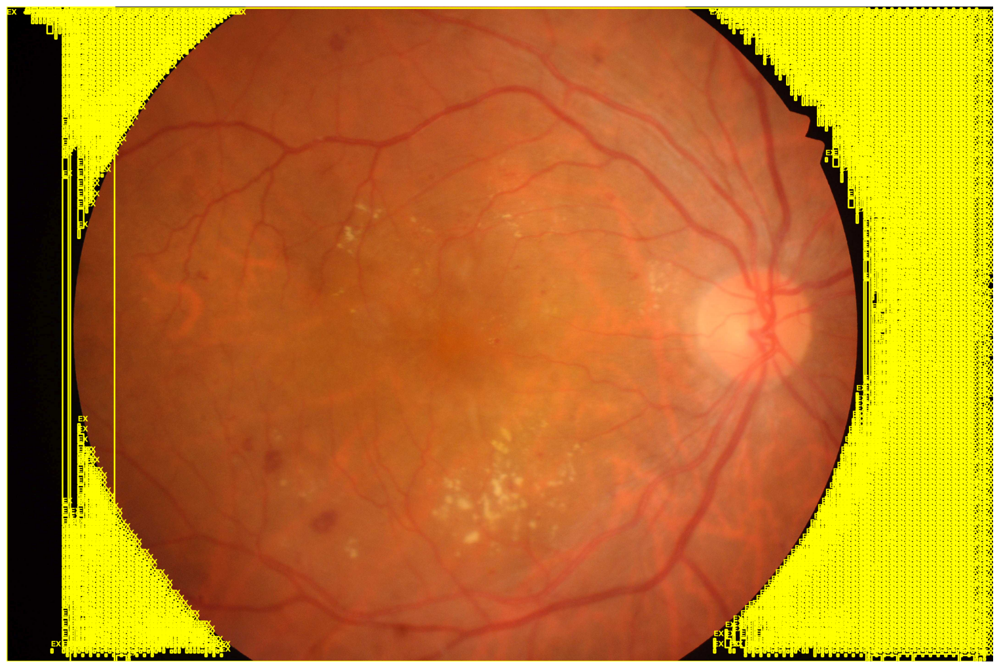


✅ SVG CREATED SUCCESSFULLY
C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening\deep-learning\outputs\IDRiD_01_lesion_segmentation.svg


In [48]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
import torch
from torchvision import transforms

# ============================================================
# 1. IMAGE PATH
# ============================================================

image_path = Path(
    r"C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening"
) / "Disease Dataset" / "A. Segmentation" / "1. Original Images" / "a. Training Set" / "IDRiD_01.jpg"

image = cv2.imread(str(image_path))

if image is None:
    raise FileNotFoundError(f"Image not found:\n{image_path}")

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

print("Original image:", image_rgb.shape)


# ============================================================
# 2. SAME PREPROCESSING FOR U-NET
# ============================================================

input_transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

pil_img = Image.fromarray(image_rgb)

input_tensor = input_transform(pil_img)
input_tensor = input_tensor.unsqueeze(0).to(device)

print("Input tensor:", input_tensor.shape)


# ============================================================
# 3. MODEL PREDICTION
# ============================================================

model.eval()

with torch.no_grad():
    output = model(input_tensor)
    prediction_512 = torch.argmax(output, dim=1)[0].cpu().numpy()

print("Prediction shape:", prediction_512.shape)

print("\nPredicted classes:")
for cls in range(5):
    count = np.sum(prediction_512 == cls)
    print(f"Class {cls}: {count:,} pixels")


# ============================================================
# 4. RESIZE PREDICTION TO ORIGINAL IMAGE
# ============================================================

prediction = cv2.resize(
    prediction_512.astype(np.uint8),
    (image_rgb.shape[1], image_rgb.shape[0]),
    interpolation=cv2.INTER_NEAREST
)


# ============================================================
# 5. LESION COLORS
# ============================================================

lesions = {
    1: ("MA", (255, 0, 0)),       # Red
    2: ("HE", (0, 255, 0)),       # Green
    3: ("EX", (255, 255, 0)),     # Yellow
    4: ("SE", (0, 255, 255))      # Cyan
}


# ============================================================
# 6. DRAW BOUNDING BOXES
# ============================================================

result = image_rgb.copy()

for class_id, (name, color) in lesions.items():

    mask = np.uint8(prediction == class_id) * 255

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
        mask,
        connectivity=8
    )

    for i in range(1, num_labels):

        area = stats[i, cv2.CC_STAT_AREA]

        # Remove tiny noise
        if area < 50:
            continue

        x = stats[i, cv2.CC_STAT_LEFT]
        y = stats[i, cv2.CC_STAT_TOP]
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]

        # Draw box
        cv2.rectangle(
            result,
            (x, y),
            (x + w, y + h),
            color,
            5
        )

        # Draw label
        cv2.putText(
            result,
            name,
            (x, max(35, y - 10)),
            cv2.FONT_HERSHEY_SIMPLEX,
            1.2,
            color,
            3,
            cv2.LINE_AA
        )


# ============================================================
# 7. SAVE SVG
# ============================================================

output_dir = Path(
    r"C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening"
) / "deep-learning" / "outputs"

output_dir.mkdir(parents=True, exist_ok=True)

svg_path = output_dir / "IDRiD_01_lesion_segmentation.svg"


plt.figure(figsize=(16, 10))

plt.imshow(result)
plt.axis("off")

plt.tight_layout(pad=0)

plt.savefig(
    svg_path,
    format="svg",
    bbox_inches="tight",
    pad_inches=0
)

plt.show()

print("\n================================")
print("✅ SVG CREATED SUCCESSFULLY")
print("================================")
print(svg_path)

Original image: 4288 x 2848
Prediction generated.
Retina pixels: 8523357


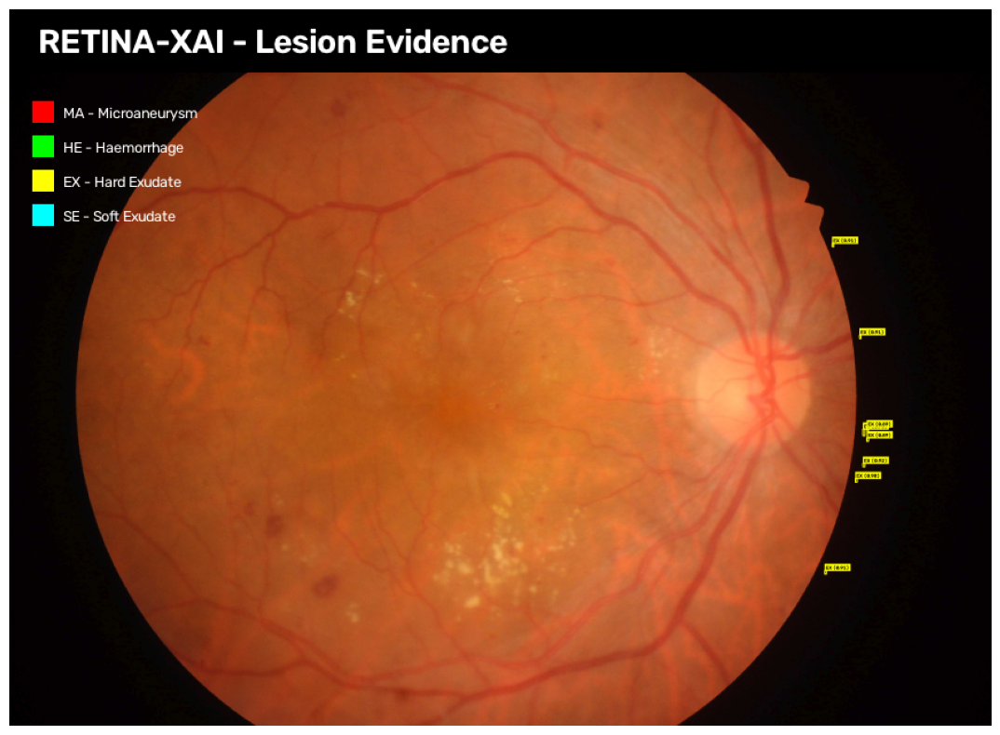


RETINA-XAI LESION DETECTION
EX  | Hard Exudate       | Confidence: 0.925 | Area: 123
EX  | Hard Exudate       | Confidence: 0.913 | Area: 104
EX  | Hard Exudate       | Confidence: 0.909 | Area: 128
EX  | Hard Exudate       | Confidence: 0.906 | Area: 107
EX  | Hard Exudate       | Confidence: 0.902 | Area: 108
EX  | Hard Exudate       | Confidence: 0.898 | Area: 256
EX  | Hard Exudate       | Confidence: 0.890 | Area: 120
EX  | Hard Exudate       | Confidence: 0.889 | Area: 120

✅ Saved:
C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening\deep-learning\outputs\IDRiD_01_lesion_detection.jpg


In [52]:
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from torchvision import transforms


# ============================================================
# CONFIGURATION
# ============================================================

IMAGE_PATH = Path(
    r"C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening"
) / "Disease Dataset" / "A. Segmentation" / "1. Original Images" / "a. Training Set" / "IDRiD_01.jpg"

OUTPUT_DIR = Path(
    r"C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening"
) / "deep-learning" / "outputs"

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

OUTPUT_PATH = OUTPUT_DIR / "IDRiD_01_lesion_detection.jpg"

DISPLAY_SIZE = (856, 570)

# Minimum lesion size in ORIGINAL pixels
MIN_AREA = {
    1: 30,      # MA
    2: 80,      # HE
    3: 100,     # EX
    4: 80       # SE
}

# Maximum percentage of retina occupied by ONE region
MAX_REGION_RATIO = 0.05

# Minimum confidence
CONFIDENCE_THRESHOLD = {
    1: 0.45,
    2: 0.45,
    3: 0.55,
    4: 0.45
}

# Maximum regions per lesion type
MAX_REGIONS = 8


# ============================================================
# LOAD IMAGE
# ============================================================

image_bgr = cv2.imread(str(IMAGE_PATH))

if image_bgr is None:
    raise FileNotFoundError(
        f"Could not load image:\n{IMAGE_PATH}"
    )

image_rgb = cv2.cvtColor(
    image_bgr,
    cv2.COLOR_BGR2RGB
)

H, W = image_rgb.shape[:2]

print("Original image:", W, "x", H)


# ============================================================
# MODEL INPUT
# ============================================================
#
# IMPORTANT:
# This must match the preprocessing used during U-Net training.
#
# If your training dataset used this normalization, keep it.
#

transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

pil_image = Image.fromarray(image_rgb)

input_tensor = transform(pil_image)
input_tensor = input_tensor.unsqueeze(0).to(device)


# ============================================================
# U-NET PREDICTION
# ============================================================

model.eval()

with torch.no_grad():

    logits = model(input_tensor)

    # Softmax gives probability for every class
    probabilities = torch.softmax(logits, dim=1)

    # Most probable class
    pred_512 = torch.argmax(
        probabilities,
        dim=1
    )[0].cpu().numpy()

    # Maximum probability
    confidence_512 = torch.max(
        probabilities,
        dim=1
    )[0][0].cpu().numpy()


print("Prediction generated.")


# ============================================================
# RESIZE TO ORIGINAL IMAGE
# ============================================================

pred = cv2.resize(
    pred_512.astype(np.uint8),
    (W, H),
    interpolation=cv2.INTER_NEAREST
)

confidence = cv2.resize(
    confidence_512.astype(np.float32),
    (W, H),
    interpolation=cv2.INTER_LINEAR
)


# ============================================================
# RETINA MASK
# ============================================================

gray = cv2.cvtColor(
    image_rgb,
    cv2.COLOR_RGB2GRAY
)

retina_mask = np.uint8(gray > 10) * 255

# Keep largest connected component
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(
    retina_mask,
    connectivity=8
)

if num_labels > 1:

    largest = 1 + np.argmax(
        stats[1:, cv2.CC_STAT_AREA]
    )

    retina_mask = np.uint8(
        labels == largest
    ) * 255

retina_area = np.sum(
    retina_mask > 0
)

print("Retina pixels:", retina_area)


# ============================================================
# LESION DEFINITIONS
# ============================================================

LESIONS = {

    1: {
        "short": "MA",
        "name": "Microaneurysm",
        "color": (255, 0, 0)
    },

    2: {
        "short": "HE",
        "name": "Haemorrhage",
        "color": (0, 255, 0)
    },

    3: {
        "short": "EX",
        "name": "Hard Exudate",
        "color": (255, 255, 0)
    },

    4: {
        "short": "SE",
        "name": "Soft Exudate",
        "color": (0, 255, 255)
    }
}


# ============================================================
# OUTPUT IMAGE
# ============================================================

result = image_rgb.copy()

detections = []


# ============================================================
# DETECT EACH LESION
# ============================================================

for class_id, info in LESIONS.items():

    # Model predicted this class
    mask = np.uint8(
        pred == class_id
    ) * 255

    # Only inside retina
    mask = cv2.bitwise_and(
        mask,
        retina_mask
    )

    # --------------------------------------------------------
    # Remove isolated noise
    # --------------------------------------------------------

    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (5, 5)
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_OPEN,
        kernel
    )

    # --------------------------------------------------------
    # Connected components
    # --------------------------------------------------------

    num_labels, component_labels, stats, centroids = \
        cv2.connectedComponentsWithStats(
            mask,
            connectivity=8
        )

    candidates = []

    for i in range(1, num_labels):

        area = stats[
            i,
            cv2.CC_STAT_AREA
        ]

        # Minimum area
        if area < MIN_AREA[class_id]:
            continue

        # Region size relative to retina
        area_ratio = area / retina_area

        # Reject giant regions
        if area_ratio > MAX_REGION_RATIO:
            continue

        x = stats[i, cv2.CC_STAT_LEFT]
        y = stats[i, cv2.CC_STAT_TOP]
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]

        # ----------------------------------------------------
        # Region confidence
        # ----------------------------------------------------

        region_pixels = (
            component_labels == i
        )

        region_confidence = float(
            confidence[region_pixels].mean()
        )

        # ----------------------------------------------------
        # Confidence threshold
        # ----------------------------------------------------

        if region_confidence < CONFIDENCE_THRESHOLD[class_id]:
            continue

        candidates.append({
            "class_id": class_id,
            "short": info["short"],
            "name": info["name"],
            "color": info["color"],
            "area": area,
            "confidence": region_confidence,
            "x": x,
            "y": y,
            "w": w,
            "h": h
        })

    # Strongest regions first
    candidates.sort(
        key=lambda x: (
            x["confidence"],
            x["area"]
        ),
        reverse=True
    )

    candidates = candidates[:MAX_REGIONS]

    detections.extend(candidates)


# ============================================================
# DRAW DETECTIONS
# ============================================================

for d in detections:

    x = d["x"]
    y = d["y"]
    w = d["w"]
    h = d["h"]

    color = d["color"]

    # --------------------------------------------------------
    # Slight transparent highlight
    # --------------------------------------------------------

    overlay = result.copy()

    # Create rectangle region
    cv2.rectangle(
        overlay,
        (x, y),
        (x + w, y + h),
        color,
        -1
    )

    result = cv2.addWeighted(
        result,
        0.85,
        overlay,
        0.15,
        0
    )

    # --------------------------------------------------------
    # Bounding box
    # --------------------------------------------------------

    cv2.rectangle(
        result,
        (x, y),
        (x + w, y + h),
        color,
        4
    )

    # --------------------------------------------------------
    # Label
    # --------------------------------------------------------

    label = (
        f"{d['short']} "
        f"({d['confidence']:.2f})"
    )

    font = cv2.FONT_HERSHEY_SIMPLEX

    font_scale = 0.75
    thickness = 2

    (tw, th), baseline = cv2.getTextSize(
        label,
        font,
        font_scale,
        thickness
    )

    label_y = max(
        th + 8,
        y
    )

    # Label background
    cv2.rectangle(
        result,
        (x, label_y - th - 8),
        (x + tw + 10, label_y + 3),
        color,
        -1
    )

    # Black text
    cv2.putText(
        result,
        label,
        (x + 5, label_y - 3),
        font,
        font_scale,
        (0, 0, 0),
        thickness,
        cv2.LINE_AA
    )


# ============================================================
# RESIZE FOR DISPLAY
# ============================================================

display = cv2.resize(
    result,
    DISPLAY_SIZE,
    interpolation=cv2.INTER_AREA
)


# ============================================================
# TOP TITLE
# ============================================================

title_height = 55

canvas = np.zeros(
    (
        DISPLAY_SIZE[1] + title_height,
        DISPLAY_SIZE[0],
        3
    ),
    dtype=np.uint8
)

canvas[
    title_height:,
    :
] = display

cv2.putText(
    canvas,
    "RETINA-XAI - Lesion Evidence",
    (25, 38),
    cv2.FONT_HERSHEY_SIMPLEX,
    1.0,
    (255, 255, 255),
    2,
    cv2.LINE_AA
)


# ============================================================
# LEGEND
# ============================================================

legend_x = 20
legend_y = title_height + 25

for i, (class_id, info) in enumerate(
    LESIONS.items()
):

    y = legend_y + i * 30

    color = info["color"]

    cv2.rectangle(
        canvas,
        (legend_x, y),
        (legend_x + 18, y + 18),
        color,
        -1
    )

    cv2.putText(
        canvas,
        f"{info['short']} - {info['name']}",
        (legend_x + 27, y + 15),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.45,
        (255, 255, 255),
        1,
        cv2.LINE_AA
    )


# ============================================================
# SAVE JPG
# ============================================================

cv2.imwrite(
    str(OUTPUT_PATH),
    cv2.cvtColor(
        canvas,
        cv2.COLOR_RGB2BGR
    ),
    [
        cv2.IMWRITE_JPEG_QUALITY,
        95
    ]
)


# ============================================================
# DISPLAY
# ============================================================

plt.figure(
    figsize=(12, 8)
)

plt.imshow(canvas)

plt.axis("off")

plt.tight_layout()

plt.show()


# ============================================================
# RESULTS
# ============================================================

print("\n======================================")
print("RETINA-XAI LESION DETECTION")
print("======================================")

if len(detections) == 0:

    print("No reliable lesion regions detected.")

else:

    for d in detections:

        print(
            f"{d['short']:3s} | "
            f"{d['name']:18s} | "
            f"Confidence: {d['confidence']:.3f} | "
            f"Area: {d['area']:,}"
        )

print("\n✅ Saved:")
print(OUTPUT_PATH)

Original: 4288 x 2848


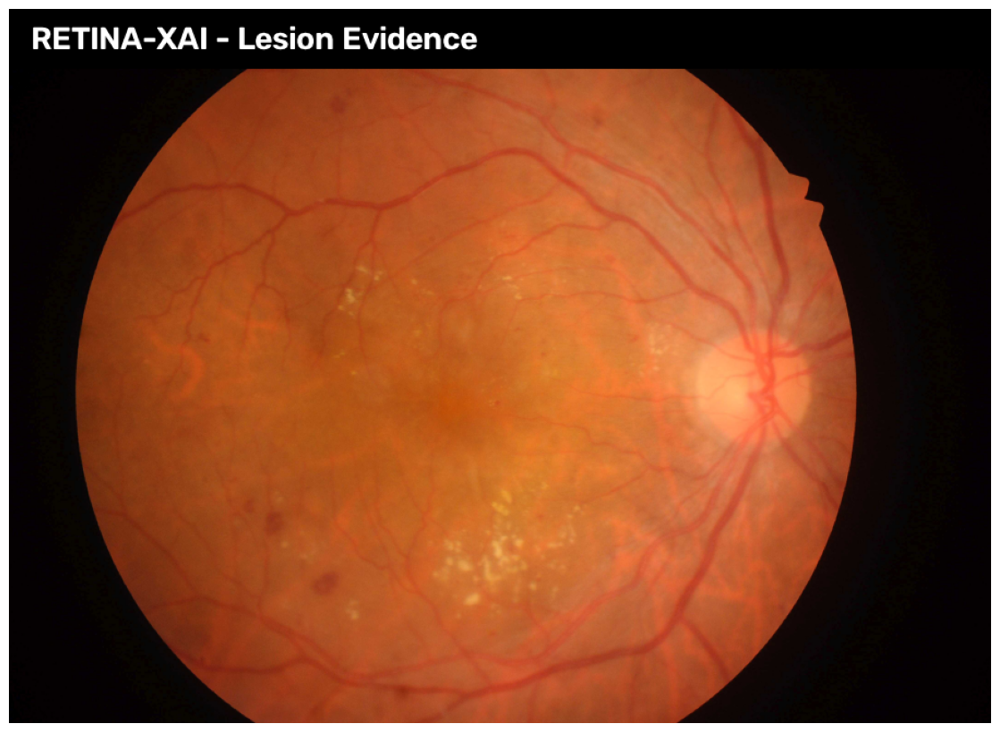


LESION EVIDENCE
No reliable lesion regions detected.

✅ Image saved:
C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening\deep-learning\outputs\IDRiD_01_lesion_evidence_clean.jpg


In [53]:
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from torchvision import transforms


# ============================================================
# CONFIG
# ============================================================

IMAGE_PATH = Path(
    r"C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening"
) / "Disease Dataset" / "A. Segmentation" / "1. Original Images" / "a. Training Set" / "IDRiD_01.jpg"

OUTPUT_DIR = Path(
    r"C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening"
) / "deep-learning" / "outputs"

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

OUTPUT_PATH = OUTPUT_DIR / "IDRiD_01_lesion_evidence_clean.jpg"


# Fixed output size
OUT_W = 900
OUT_H = 600


# ============================================================
# 1. LOAD ORIGINAL IMAGE
# ============================================================

img_bgr = cv2.imread(str(IMAGE_PATH))

if img_bgr is None:
    raise FileNotFoundError(IMAGE_PATH)

img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

H, W = img_rgb.shape[:2]

print(f"Original: {W} x {H}")


# ============================================================
# 2. PREPROCESSING
# ============================================================
#
# IMPORTANT:
# U-Net was trained from scratch.
#
# Do NOT use ImageNet normalization here unless your
# training Dataset class also used it.
#
# ============================================================

transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])

input_tensor = transform(
    Image.fromarray(img_rgb)
).unsqueeze(0).to(device)


# ============================================================
# 3. MODEL PREDICTION
# ============================================================

model.eval()

with torch.no_grad():

    logits = model(input_tensor)

    probs = torch.softmax(logits, dim=1)

    pred_512 = torch.argmax(
        probs,
        dim=1
    )[0].cpu().numpy()

    confidence_512 = torch.max(
        probs,
        dim=1
    )[0].cpu().numpy()[0]


# ============================================================
# 4. RESIZE PREDICTION TO ORIGINAL
# ============================================================

pred = cv2.resize(
    pred_512.astype(np.uint8),
    (W, H),
    interpolation=cv2.INTER_NEAREST
)

confidence = cv2.resize(
    confidence_512.astype(np.float32),
    (W, H),
    interpolation=cv2.INTER_LINEAR
)


# ============================================================
# 5. CREATE RETINA MASK
# ============================================================

gray = cv2.cvtColor(
    img_rgb,
    cv2.COLOR_RGB2GRAY
)

retina_mask = np.uint8(gray > 15) * 255

# Remove tiny outside regions
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(
    retina_mask,
    8
)

if num_labels > 1:

    largest = 1 + np.argmax(
        stats[1:, cv2.CC_STAT_AREA]
    )

    retina_mask = np.uint8(
        labels == largest
    ) * 255

retina_area = np.sum(
    retina_mask > 0
)


# ============================================================
# 6. LESION SETTINGS
# ============================================================

LESIONS = {

    1: {
        "name": "Microaneurysm",
        "short": "MA",
        "color": (255, 0, 0),
        "min_area": 20
    },

    2: {
        "name": "Haemorrhage",
        "short": "HE",
        "color": (0, 255, 0),
        "min_area": 50
    },

    3: {
        "name": "Hard Exudate",
        "short": "EX",
        "color": (255, 255, 0),
        "min_area": 50
    },

    4: {
        "name": "Soft Exudate",
        "short": "SE",
        "color": (0, 255, 255),
        "min_area": 50
    }
}


# ============================================================
# 7. RESULT IMAGE
# ============================================================

result = img_rgb.copy()

detections = []


# ============================================================
# 8. FIND LESION REGIONS
# ============================================================

for class_id, info in LESIONS.items():

    mask = np.uint8(
        pred == class_id
    ) * 255

    # Only retina
    mask = cv2.bitwise_and(
        mask,
        retina_mask
    )

    # Small cleanup
    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (5, 5)
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_OPEN,
        kernel
    )

    num_labels, component_labels, stats, centroids = \
        cv2.connectedComponentsWithStats(
            mask,
            8
        )

    candidates = []

    for i in range(1, num_labels):

        area = stats[
            i,
            cv2.CC_STAT_AREA
        ]

        if area < info["min_area"]:
            continue

        # Reject giant regions
        ratio = area / retina_area

        if ratio > 0.01:
            continue

        x = stats[i, cv2.CC_STAT_LEFT]
        y = stats[i, cv2.CC_STAT_TOP]
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]

        # Ignore absurdly large boxes
        if w > W * 0.25 or h > H * 0.25:
            continue

        # Region confidence
        region_pixels = (
            component_labels == i
        )

        conf = float(
            confidence[region_pixels].mean()
        )

        # Confidence threshold
        if conf < 0.60:
            continue

        candidates.append({
            "class_id": class_id,
            "name": info["name"],
            "short": info["short"],
            "color": info["color"],
            "area": area,
            "confidence": conf,
            "x": x,
            "y": y,
            "w": w,
            "h": h
        })

    # Strongest first
    candidates.sort(
        key=lambda d: d["confidence"],
        reverse=True
    )

    # Maximum 5 regions per class
    candidates = candidates[:5]

    detections.extend(candidates)


# ============================================================
# 9. DRAW DETECTIONS
# ============================================================

for d in detections:

    x = d["x"]
    y = d["y"]
    w = d["w"]
    h = d["h"]

    color = d["color"]

    # Box
    cv2.rectangle(
        result,
        (x, y),
        (x + w, y + h),
        color,
        6
    )

    # Label
    text = (
        f"{d['short']} "
        f"{d['confidence']:.2f}"
    )

    font = cv2.FONT_HERSHEY_SIMPLEX
    scale = 1.0
    thickness = 3

    (tw, th), _ = cv2.getTextSize(
        text,
        font,
        scale,
        thickness
    )

    label_y = max(
        th + 10,
        y
    )

    # Label background
    cv2.rectangle(
        result,
        (x, label_y - th - 12),
        (x + tw + 12, label_y + 5),
        color,
        -1
    )

    # Text
    cv2.putText(
        result,
        text,
        (x + 6, label_y - 5),
        font,
        scale,
        (0, 0, 0),
        thickness,
        cv2.LINE_AA
    )


# ============================================================
# 10. RESIZE FINAL IMAGE
# ============================================================

display = cv2.resize(
    result,
    (OUT_W, OUT_H),
    interpolation=cv2.INTER_AREA
)


# ============================================================
# 11. ADD SMALL TITLE BAR
# ============================================================

title_bar = np.zeros(
    (55, OUT_W, 3),
    dtype=np.uint8
)

cv2.putText(
    title_bar,
    "RETINA-XAI - Lesion Evidence",
    (20, 37),
    cv2.FONT_HERSHEY_SIMPLEX,
    1.0,
    (255, 255, 255),
    2,
    cv2.LINE_AA
)

final_image = np.vstack([
    title_bar,
    display
])


# ============================================================
# 12. SAVE JPG
# ============================================================

cv2.imwrite(
    str(OUTPUT_PATH),
    cv2.cvtColor(
        final_image,
        cv2.COLOR_RGB2BGR
    ),
    [cv2.IMWRITE_JPEG_QUALITY, 95]
)


# ============================================================
# 13. DISPLAY SMALL, FIXED SIZE
# ============================================================

plt.figure(
    figsize=(12, 8),
    dpi=100
)

plt.imshow(final_image)

plt.axis("off")

plt.tight_layout(
    pad=0
)

plt.show()


# ============================================================
# 14. RESULTS
# ============================================================

print("\n======================================")
print("LESION EVIDENCE")
print("======================================")

if len(detections) == 0:

    print("No reliable lesion regions detected.")

else:

    for d in detections:

        print(
            f"{d['short']} | "
            f"{d['name']} | "
            f"Confidence = {d['confidence']:.2f} | "
            f"Area = {d['area']}"
        )

print("\n✅ Image saved:")
print(OUTPUT_PATH)

Testing: C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening\Disease Dataset\A. Segmentation\1. Original Images\a. Training Set\IDRiD_02.jpg
Original size: 4288 x 2848

===== PREDICTION DISTRIBUTION =====
Background          : 6,693,637 (54.81%)
Microaneurysm       : 0 (0.00%)
Haemorrhage         : 4,994,304 (40.90%)
Hard Exudate        : 515,169 (4.22%)
Soft Exudate        : 9,114 (0.07%)


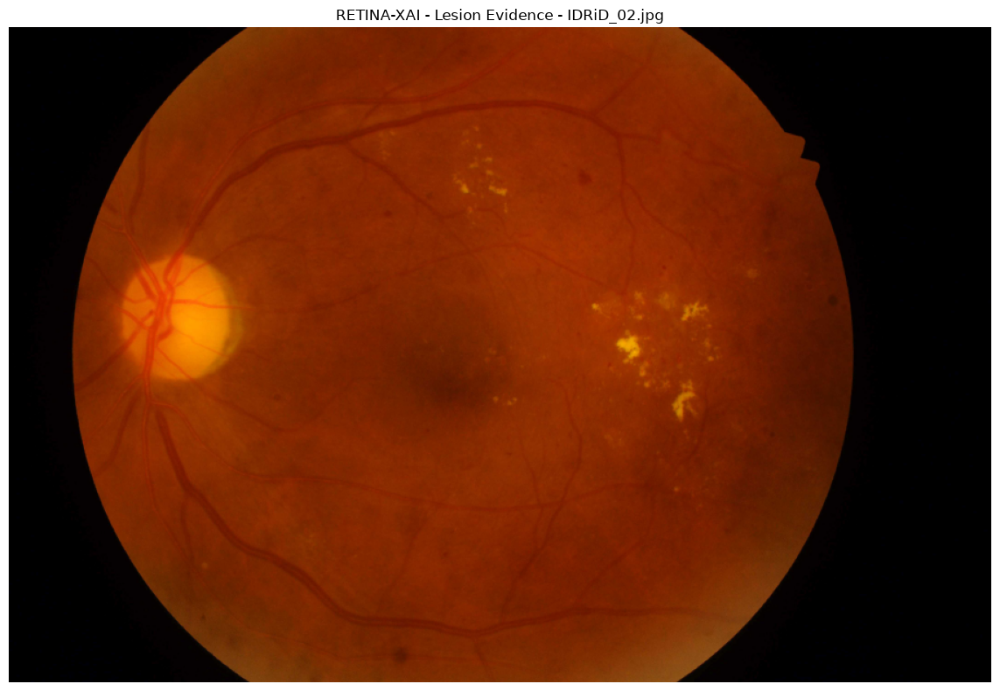


===== DETECTED REGIONS =====
No reliable lesion regions detected.


In [54]:
# ============================================================
# TEST ANOTHER IDRiD IMAGE
# ============================================================

from pathlib import Path
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

# ------------------------------------------------------------
# CHANGE THIS NUMBER TO TEST OTHER IMAGES
# ------------------------------------------------------------

IMAGE_NAME = "IDRiD_02.jpg"

IMAGE_PATH = (
    Path(r"C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening")
    / "Disease Dataset"
    / "A. Segmentation"
    / "1. Original Images"
    / "a. Training Set"
    / IMAGE_NAME
)

print("Testing:", IMAGE_PATH)


# ============================================================
# LOAD IMAGE
# ============================================================

img_bgr = cv2.imread(str(IMAGE_PATH))

if img_bgr is None:
    raise FileNotFoundError(
        f"Image not found:\n{IMAGE_PATH}"
    )

img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

H, W = img_rgb.shape[:2]

print(f"Original size: {W} x {H}")


# ============================================================
# MODEL INPUT
# ============================================================

transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])

input_tensor = transform(
    Image.fromarray(img_rgb)
).unsqueeze(0).to(device)


# ============================================================
# PREDICTION
# ============================================================

model.eval()

with torch.no_grad():

    logits = model(input_tensor)

    probs = torch.softmax(logits, dim=1)

    pred_512 = torch.argmax(
        probs,
        dim=1
    )[0].cpu().numpy()

    confidence_512 = torch.max(
        probs,
        dim=1
    )[0][0].cpu().numpy()


# ============================================================
# RESIZE PREDICTION
# ============================================================

pred = cv2.resize(
    pred_512.astype(np.uint8),
    (W, H),
    interpolation=cv2.INTER_NEAREST
)

confidence = cv2.resize(
    confidence_512.astype(np.float32),
    (W, H),
    interpolation=cv2.INTER_LINEAR
)


# ============================================================
# PRINT PIXEL DISTRIBUTION
# ============================================================

names = [
    "Background",
    "Microaneurysm",
    "Haemorrhage",
    "Hard Exudate",
    "Soft Exudate"
]

print("\n===== PREDICTION DISTRIBUTION =====")

total = pred.size

for cls in range(5):

    count = np.sum(pred == cls)

    percentage = 100 * count / total

    print(
        f"{names[cls]:20s}: "
        f"{count:,} "
        f"({percentage:.2f}%)"
    )


# ============================================================
# RETINA MASK
# ============================================================

gray = cv2.cvtColor(
    img_rgb,
    cv2.COLOR_RGB2GRAY
)

retina_mask = np.uint8(
    gray > 15
) * 255

num_labels, labels, stats, _ = \
    cv2.connectedComponentsWithStats(
        retina_mask,
        8
    )

if num_labels > 1:

    largest = 1 + np.argmax(
        stats[1:, cv2.CC_STAT_AREA]
    )

    retina_mask = np.uint8(
        labels == largest
    ) * 255

retina_area = np.sum(
    retina_mask > 0
)


# ============================================================
# LESION SETTINGS
# ============================================================

LESIONS = {

    1: ("MA", "Microaneurysm", (255, 0, 0)),

    2: ("HE", "Haemorrhage", (0, 255, 0)),

    3: ("EX", "Hard Exudate", (255, 255, 0)),

    4: ("SE", "Soft Exudate", (0, 255, 255))
}


# ============================================================
# DETECT REGIONS
# ============================================================

result = img_rgb.copy()

detections = []


for class_id, (short, name, color) in LESIONS.items():

    mask = np.uint8(
        pred == class_id
    ) * 255

    mask = cv2.bitwise_and(
        mask,
        retina_mask
    )

    # Small cleanup
    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (5, 5)
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_OPEN,
        kernel
    )

    num_labels, component_labels, stats, _ = \
        cv2.connectedComponentsWithStats(
            mask,
            8
        )

    candidates = []

    for i in range(1, num_labels):

        area = stats[
            i,
            cv2.CC_STAT_AREA
        ]

        # Minimum size
        if area < 30:
            continue

        # Reject giant regions
        if area / retina_area > 0.01:
            continue

        x = stats[i, cv2.CC_STAT_LEFT]
        y = stats[i, cv2.CC_STAT_TOP]
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]

        # Reject giant boxes
        if w > W * 0.20 or h > H * 0.20:
            continue

        component = (
            component_labels == i
        )

        conf = float(
            confidence[component].mean()
        )

        # Confidence threshold
        if conf < 0.60:
            continue

        candidates.append({
            "short": short,
            "name": name,
            "color": color,
            "area": area,
            "confidence": conf,
            "x": x,
            "y": y,
            "w": w,
            "h": h
        })

    candidates.sort(
        key=lambda x: x["confidence"],
        reverse=True
    )

    # Maximum 5 per lesion
    detections.extend(
        candidates[:5]
    )


# ============================================================
# DRAW DETECTIONS
# ============================================================

for d in detections:

    x = d["x"]
    y = d["y"]
    w = d["w"]
    h = d["h"]

    color = d["color"]

    # Bounding box
    cv2.rectangle(
        result,
        (x, y),
        (x + w, y + h),
        color,
        5
    )

    # Label
    text = (
        f"{d['short']} "
        f"({d['confidence']:.2f})"
    )

    font = cv2.FONT_HERSHEY_SIMPLEX

    scale = 0.9
    thickness = 2

    (tw, th), _ = cv2.getTextSize(
        text,
        font,
        scale,
        thickness
    )

    label_y = max(
        th + 8,
        y
    )

    cv2.rectangle(
        result,
        (x, label_y - th - 10),
        (x + tw + 10, label_y + 3),
        color,
        -1
    )

    cv2.putText(
        result,
        text,
        (x + 5, label_y - 4),
        font,
        scale,
        (0, 0, 0),
        thickness,
        cv2.LINE_AA
    )


# ============================================================
# RESIZE FOR OBSERVATION
# ============================================================

DISPLAY_W = 900
DISPLAY_H = 600

display = cv2.resize(
    result,
    (DISPLAY_W, DISPLAY_H),
    interpolation=cv2.INTER_AREA
)


# ============================================================
# SHOW
# ============================================================

plt.figure(
    figsize=(12, 8)
)

plt.imshow(display)

plt.axis("off")

plt.title(
    f"RETINA-XAI - Lesion Evidence - {IMAGE_NAME}"
)

plt.tight_layout()

plt.show()


# ============================================================
# SUMMARY
# ============================================================

print("\n===== DETECTED REGIONS =====")

if not detections:

    print("No reliable lesion regions detected.")

else:

    for d in detections:

        print(
            f"{d['short']} | "
            f"{d['name']} | "
            f"Confidence: {d['confidence']:.2f} | "
            f"Area: {d['area']:,}"
        )

Image: IDRiD_02.jpg
Size : 4288 x 2848
No mask: SE


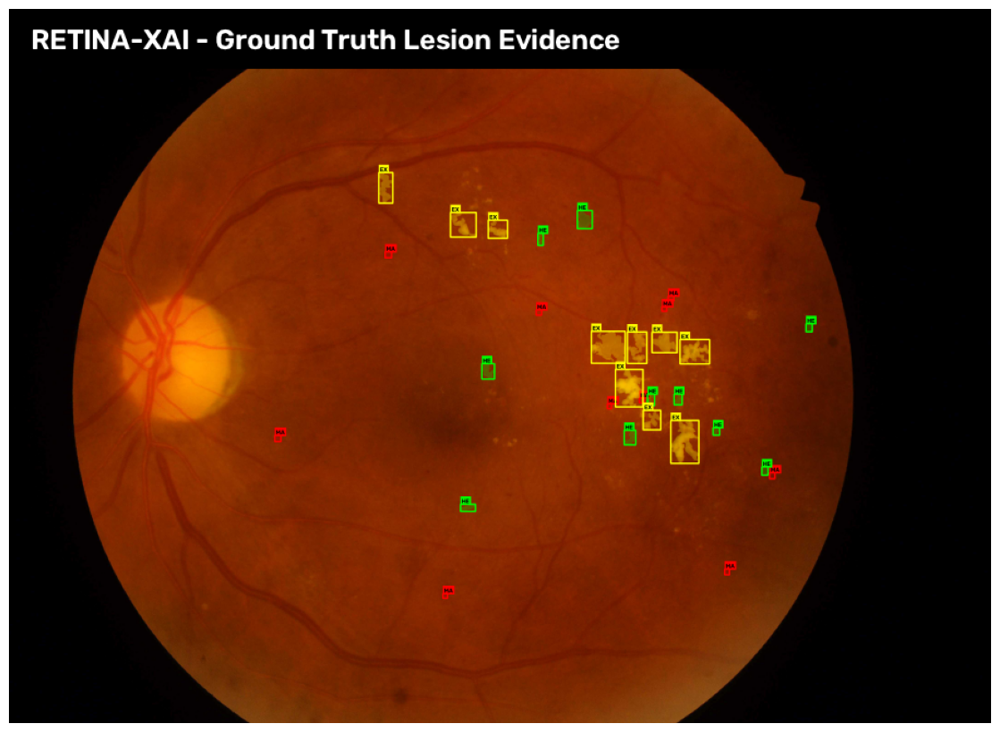


GROUND-TRUTH LESION EVIDENCE
MA  - Microaneurysm     : 10 regions
HE  - Haemorrhage       : 10 regions
EX  - Hard Exudate      : 10 regions

✅ SVG saved:
C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening\deep-learning\outputs\IDRiD_02_ground_truth_lesion_evidence.svg


In [55]:

import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path


# ============================================================
# PATHS
# ============================================================

ROOT = Path(
    r"C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening"
)

IMAGE_NAME = "IDRiD_02.jpg"
IMAGE_ID = IMAGE_NAME.replace(".jpg", "")

IMAGE_PATH = (
    ROOT
    / "Disease Dataset"
    / "A. Segmentation"
    / "1. Original Images"
    / "a. Training Set"
    / IMAGE_NAME
)

MASK_ROOT = (
    ROOT
    / "Disease Dataset"
    / "A. Segmentation"
    / "2. All Segmentation Groundtruths"
    / "a. Training Set"
)


# ============================================================
# LOAD ORIGINAL
# ============================================================

img = cv2.imread(str(IMAGE_PATH))

if img is None:
    raise FileNotFoundError(IMAGE_PATH)

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

H, W = img.shape[:2]

print("Image:", IMAGE_NAME)
print("Size :", W, "x", H)


# ============================================================
# LESION MASK PATHS
# ============================================================

mask_paths = {
    1: MASK_ROOT / "1. Microaneurysms" / f"{IMAGE_ID}_MA.tif",
    2: MASK_ROOT / "2. Haemorrhages" / f"{IMAGE_ID}_HE.tif",
    3: MASK_ROOT / "3. Hard Exudates" / f"{IMAGE_ID}_EX.tif",
    4: MASK_ROOT / "4. Soft Exudates" / f"{IMAGE_ID}_SE.tif"
}

lesions = {
    1: ("MA", "Microaneurysm", (255, 0, 0)),
    2: ("HE", "Haemorrhage", (0, 255, 0)),
    3: ("EX", "Hard Exudate", (255, 255, 0)),
    4: ("SE", "Soft Exudate", (0, 255, 255))
}


# ============================================================
# OUTPUT
# ============================================================

result = img.copy()

detections = []


# ============================================================
# PROCESS GROUND-TRUTH MASKS
# ============================================================

for class_id, mask_path in mask_paths.items():

    short, name, color = lesions[class_id]

    if mask_path.exists():

        mask = cv2.imread(
            str(mask_path),
            cv2.IMREAD_GRAYSCALE
        )

        if mask is None:
            continue

        # Ensure same size
        if mask.shape != (H, W):

            mask = cv2.resize(
                mask,
                (W, H),
                interpolation=cv2.INTER_NEAREST
            )

        binary = np.uint8(mask > 0) * 255

    else:

        print(f"No mask: {short}")
        continue


    # ========================================================
    # CONNECTED COMPONENTS
    # ========================================================

    num_labels, labels, stats, centroids = \
        cv2.connectedComponentsWithStats(
            binary,
            connectivity=8
        )

    regions = []

    for i in range(1, num_labels):

        area = stats[
            i,
            cv2.CC_STAT_AREA
        ]

        # Remove tiny noise
        if area < 20:
            continue

        x = stats[i, cv2.CC_STAT_LEFT]
        y = stats[i, cv2.CC_STAT_TOP]
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]

        regions.append(
            (area, x, y, w, h, i)
        )


    # Largest regions first
    regions.sort(
        reverse=True
    )

    # Keep maximum 10 per lesion type
    regions = regions[:10]

    detections.append(
        (class_id, short, name, color, regions, labels)
    )


# ============================================================
# DRAW LESIONS
# ============================================================

for class_id, short, name, color, regions, labels in detections:

    for area, x, y, w, h, component_id in regions:

        # ----------------------------------------------------
        # Transparent colored lesion area
        # ----------------------------------------------------

        component = np.uint8(
            labels == component_id
        )

        overlay = result.copy()

        overlay[component > 0] = color

        result = cv2.addWeighted(
            result,
            0.75,
            overlay,
            0.25,
            0
        )

        # ----------------------------------------------------
        # Bounding box
        # ----------------------------------------------------

        cv2.rectangle(
            result,
            (x, y),
            (x + w, y + h),
            color,
            5
        )

        # ----------------------------------------------------
        # Label
        # ----------------------------------------------------

        label = short

        font = cv2.FONT_HERSHEY_SIMPLEX

        scale = 0.9
        thickness = 2

        (tw, th), _ = cv2.getTextSize(
            label,
            font,
            scale,
            thickness
        )

        label_y = max(
            th + 5,
            y
        )

        cv2.rectangle(
            result,
            (x, label_y - th - 10),
            (x + tw + 10, label_y + 3),
            color,
            -1
        )

        cv2.putText(
            result,
            label,
            (x + 5, label_y - 4),
            font,
            scale,
            (0, 0, 0),
            thickness,
            cv2.LINE_AA
        )


# ============================================================
# RESIZE FOR OBSERVATION
# ============================================================

DISPLAY_W = 900
DISPLAY_H = 600

display = cv2.resize(
    result,
    (DISPLAY_W, DISPLAY_H),
    interpolation=cv2.INTER_AREA
)


# ============================================================
# TITLE
# ============================================================

title = np.zeros(
    (55, DISPLAY_W, 3),
    dtype=np.uint8
)

cv2.putText(
    title,
    "RETINA-XAI - Ground Truth Lesion Evidence",
    (20, 37),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.9,
    (255, 255, 255),
    2,
    cv2.LINE_AA
)

final_image = np.vstack([
    title,
    display
])


# ============================================================
# SAVE SVG
# ============================================================

output_path = (
    ROOT
    / "deep-learning"
    / "outputs"
    / f"{IMAGE_ID}_ground_truth_lesion_evidence.svg"
)

plt.figure(
    figsize=(12, 8)
)

plt.imshow(final_image)
plt.axis("off")
plt.tight_layout(pad=0)

plt.savefig(
    str(output_path),
    format="svg",
    bbox_inches="tight",
    pad_inches=0
)

plt.show()


# ============================================================
# SUMMARY
# ============================================================

print("\n========================================")
print("GROUND-TRUTH LESION EVIDENCE")
print("========================================")

for class_id, short, name, color, regions, labels in detections:

    print(
        f"{short:3s} - {name:18s}: "
        f"{len(regions)} regions"
    )

print("\n✅ SVG saved:")
print(output_path)

Original image: 4288 × 2848
⚠️ No mask found for Soft Exudate


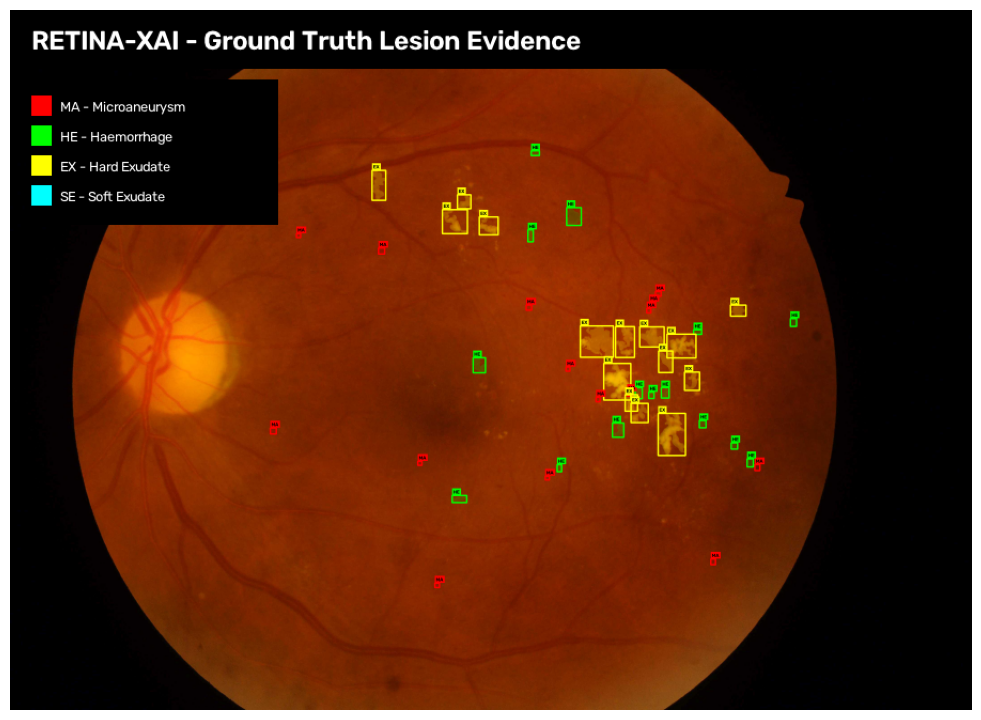


RETINA-XAI LESION EVIDENCE
MA  : 15 regions
HE  : 15 regions
EX  : 15 regions
SE  : 0 regions

JPG:
C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening\deep-learning\outputs\IDRiD_02_ground_truth_evidence.jpg

SVG:
C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening\deep-learning\outputs\IDRiD_02_ground_truth_evidence.svg


In [56]:
# ============================================================
# RETINA-XAI
# CLEAN GROUND-TRUTH LESION EVIDENCE
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path


# ============================================================
# 1. PATHS
# ============================================================

ROOT = Path(
    r"C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening"
)

IMAGE_NAME = "IDRiD_02.jpg"
IMAGE_ID = IMAGE_NAME.replace(".jpg", "")

IMAGE_PATH = (
    ROOT
    / "Disease Dataset"
    / "A. Segmentation"
    / "1. Original Images"
    / "a. Training Set"
    / IMAGE_NAME
)

MASK_ROOT = (
    ROOT
    / "Disease Dataset"
    / "A. Segmentation"
    / "2. All Segmentation Groundtruths"
    / "a. Training Set"
)

OUTPUT_DIR = (
    ROOT
    / "deep-learning"
    / "outputs"
)

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# ============================================================
# 2. OUTPUT SIZE
# ============================================================

DISPLAY_WIDTH = 900
DISPLAY_HEIGHT = 600


# ============================================================
# 3. LOAD ORIGINAL RETINA
# ============================================================

image_bgr = cv2.imread(
    str(IMAGE_PATH)
)

if image_bgr is None:
    raise FileNotFoundError(
        f"Image not found:\n{IMAGE_PATH}"
    )

image_rgb = cv2.cvtColor(
    image_bgr,
    cv2.COLOR_BGR2RGB
)

H, W = image_rgb.shape[:2]

print(f"Original image: {W} × {H}")


# ============================================================
# 4. LESION DEFINITIONS
# ============================================================

LESIONS = {

    1: {
        "short": "MA",
        "name": "Microaneurysm",
        "color": (255, 0, 0),
        "min_area": 15
    },

    2: {
        "short": "HE",
        "name": "Haemorrhage",
        "color": (0, 255, 0),
        "min_area": 30
    },

    3: {
        "short": "EX",
        "name": "Hard Exudate",
        "color": (255, 255, 0),
        "min_area": 30
    },

    4: {
        "short": "SE",
        "name": "Soft Exudate",
        "color": (0, 255, 255),
        "min_area": 30
    }
}


# ============================================================
# 5. MASK FILES
# ============================================================

MASK_PATHS = {

    1: MASK_ROOT
       / "1. Microaneurysms"
       / f"{IMAGE_ID}_MA.tif",

    2: MASK_ROOT
       / "2. Haemorrhages"
       / f"{IMAGE_ID}_HE.tif",

    3: MASK_ROOT
       / "3. Hard Exudates"
       / f"{IMAGE_ID}_EX.tif",

    4: MASK_ROOT
       / "4. Soft Exudates"
       / f"{IMAGE_ID}_SE.tif"
}


# ============================================================
# 6. RESULT IMAGE
# ============================================================

result = image_rgb.copy()

detection_counts = {}


# ============================================================
# 7. PROCESS EACH LESION
# ============================================================

for class_id, info in LESIONS.items():

    short = info["short"]
    name = info["name"]
    color = info["color"]
    min_area = info["min_area"]

    mask_path = MASK_PATHS[class_id]

    # --------------------------------------------------------
    # If mask doesn't exist
    # --------------------------------------------------------

    if not mask_path.exists():

        detection_counts[short] = 0

        print(
            f"⚠️ No mask found for {name}"
        )

        continue


    # --------------------------------------------------------
    # Read mask
    # --------------------------------------------------------

    mask = cv2.imread(
        str(mask_path),
        cv2.IMREAD_GRAYSCALE
    )

    if mask is None:

        detection_counts[short] = 0

        continue


    # --------------------------------------------------------
    # Resize mask if required
    # --------------------------------------------------------

    if mask.shape != (H, W):

        mask = cv2.resize(
            mask,
            (W, H),
            interpolation=cv2.INTER_NEAREST
        )


    binary = np.uint8(
        mask > 0
    ) * 255


    # --------------------------------------------------------
    # Small morphological cleanup
    # --------------------------------------------------------

    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (3, 3)
    )

    binary = cv2.morphologyEx(
        binary,
        cv2.MORPH_OPEN,
        kernel
    )


    # --------------------------------------------------------
    # Connected components
    # --------------------------------------------------------

    num_labels, labels, stats, centroids = \
        cv2.connectedComponentsWithStats(
            binary,
            connectivity=8
        )


    regions = []

    for i in range(1, num_labels):

        area = stats[
            i,
            cv2.CC_STAT_AREA
        ]

        if area < min_area:
            continue

        x = stats[
            i,
            cv2.CC_STAT_LEFT
        ]

        y = stats[
            i,
            cv2.CC_STAT_TOP
        ]

        w = stats[
            i,
            cv2.CC_STAT_WIDTH
        ]

        h = stats[
            i,
            cv2.CC_STAT_HEIGHT
        ]

        regions.append({
            "area": area,
            "x": x,
            "y": y,
            "w": w,
            "h": h,
            "id": i
        })


    # --------------------------------------------------------
    # Sort largest lesions first
    # --------------------------------------------------------

    regions.sort(
        key=lambda r: r["area"],
        reverse=True
    )


    # --------------------------------------------------------
    # Limit number of displayed regions
    #
    # This prevents hundreds of tiny boxes.
    # --------------------------------------------------------

    MAX_REGIONS = 15

    regions = regions[:MAX_REGIONS]

    detection_counts[short] = len(regions)


    # ========================================================
    # DRAW LESION REGIONS
    # ========================================================

    for region in regions:

        x = region["x"]
        y = region["y"]
        w = region["w"]
        h = region["h"]
        component_id = region["id"]


        # ----------------------------------------------------
        # Component mask
        # ----------------------------------------------------

        component = np.uint8(
            labels == component_id
        )


        # ----------------------------------------------------
        # Transparent lesion highlight
        # ----------------------------------------------------

        overlay = result.copy()

        overlay[
            component > 0
        ] = color


        result = cv2.addWeighted(
            result,
            0.82,
            overlay,
            0.18,
            0
        )


        # ----------------------------------------------------
        # Bounding box
        # ----------------------------------------------------

        cv2.rectangle(
            result,
            (x, y),
            (x + w, y + h),
            color,
            5
        )


# ============================================================
# 8. DRAW LABELS
# ============================================================

# Collect all boxes first
all_boxes = []

for class_id, info in LESIONS.items():

    mask_path = MASK_PATHS[class_id]

    if not mask_path.exists():
        continue

    mask = cv2.imread(
        str(mask_path),
        cv2.IMREAD_GRAYSCALE
    )

    if mask is None:
        continue

    if mask.shape != (H, W):

        mask = cv2.resize(
            mask,
            (W, H),
            interpolation=cv2.INTER_NEAREST
        )

    binary = np.uint8(mask > 0) * 255

    num_labels, labels, stats, _ = \
        cv2.connectedComponentsWithStats(
            binary,
            connectivity=8
        )

    regions = []

    for i in range(1, num_labels):

        area = stats[
            i,
            cv2.CC_STAT_AREA
        ]

        if area < LESIONS[class_id]["min_area"]:
            continue

        x = stats[
            i,
            cv2.CC_STAT_LEFT
        ]

        y = stats[
            i,
            cv2.CC_STAT_TOP
        ]

        w = stats[
            i,
            cv2.CC_STAT_WIDTH
        ]

        h = stats[
            i,
            cv2.CC_STAT_HEIGHT
        ]

        regions.append(
            (area, x, y, w, h)
        )

    regions.sort(
        reverse=True
    )

    regions = regions[:15]

    for area, x, y, w, h in regions:

        all_boxes.append({
            "short": LESIONS[class_id]["short"],
            "name": LESIONS[class_id]["name"],
            "color": LESIONS[class_id]["color"],
            "x": x,
            "y": y,
            "w": w,
            "h": h
        })


# ============================================================
# 9. DRAW SHORT LABELS
# ============================================================

font = cv2.FONT_HERSHEY_SIMPLEX

for box in all_boxes:

    x = box["x"]
    y = box["y"]
    w = box["w"]
    h = box["h"]

    short = box["short"]
    color = box["color"]


    # --------------------------------------------------------
    # Label size
    # --------------------------------------------------------

    font_scale = 0.75
    thickness = 2

    (tw, th), _ = cv2.getTextSize(
        short,
        font,
        font_scale,
        thickness
    )


    # --------------------------------------------------------
    # Position label above box
    # --------------------------------------------------------

    label_x = x

    label_y = y - 5

    if label_y < th + 5:

        label_y = y + th + 5


    # --------------------------------------------------------
    # Label background
    # --------------------------------------------------------

    cv2.rectangle(
        result,
        (
            label_x,
            label_y - th - 7
        ),
        (
            label_x + tw + 10,
            label_y + 3
        ),
        color,
        -1
    )


    # --------------------------------------------------------
    # Label text
    # --------------------------------------------------------

    cv2.putText(
        result,
        short,
        (
            label_x + 5,
            label_y - 3
        ),
        font,
        font_scale,
        (0, 0, 0),
        thickness,
        cv2.LINE_AA
    )


# ============================================================
# 10. RESIZE IMAGE
# ============================================================

display = cv2.resize(
    result,
    (
        DISPLAY_WIDTH,
        DISPLAY_HEIGHT
    ),
    interpolation=cv2.INTER_AREA
)


# ============================================================
# 11. TITLE BAR
# ============================================================

TITLE_HEIGHT = 55

canvas = np.zeros(
    (
        DISPLAY_HEIGHT + TITLE_HEIGHT,
        DISPLAY_WIDTH,
        3
    ),
    dtype=np.uint8
)


canvas[
    TITLE_HEIGHT:
] = display


cv2.putText(
    canvas,
    "RETINA-XAI - Ground Truth Lesion Evidence",
    (20, 37),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.85,
    (255, 255, 255),
    2,
    cv2.LINE_AA
)


# ============================================================
# 12. LEGEND
# ============================================================

legend_x = 20
legend_y = TITLE_HEIGHT + 25

# Legend background
cv2.rectangle(
    canvas,
    (15, TITLE_HEIGHT + 10),
    (250, TITLE_HEIGHT + 145),
    (0, 0, 0),
    -1
)


for i, (class_id, info) in enumerate(
    LESIONS.items()
):

    y = legend_y + i * 28

    color = info["color"]

    cv2.rectangle(
        canvas,
        (legend_x, y),
        (legend_x + 18, y + 18),
        color,
        -1
    )

    cv2.putText(
        canvas,
        f"{info['short']} - {info['name']}",
        (legend_x + 27, y + 15),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.45,
        (255, 255, 255),
        1,
        cv2.LINE_AA
    )


# ============================================================
# 13. SAVE JPG
# ============================================================

jpg_path = (
    OUTPUT_DIR
    / f"{IMAGE_ID}_ground_truth_evidence.jpg"
)

cv2.imwrite(
    str(jpg_path),
    cv2.cvtColor(
        canvas,
        cv2.COLOR_RGB2BGR
    ),
    [
        cv2.IMWRITE_JPEG_QUALITY,
        95
    ]
)


# ============================================================
# 14. SAVE SVG
# ============================================================

svg_path = (
    OUTPUT_DIR
    / f"{IMAGE_ID}_ground_truth_evidence.svg"
)

plt.figure(
    figsize=(10, 7)
)

plt.imshow(canvas)

plt.axis("off")

plt.tight_layout(
    pad=0
)

plt.savefig(
    str(svg_path),
    format="svg",
    bbox_inches="tight",
    pad_inches=0
)

plt.close()


# ============================================================
# 15. DISPLAY
# ============================================================

plt.figure(
    figsize=(10, 7),
    dpi=100
)

plt.imshow(canvas)

plt.axis("off")

plt.tight_layout(
    pad=0
)

plt.show()


# ============================================================
# 16. SUMMARY
# ============================================================

print("\n======================================")
print("RETINA-XAI LESION EVIDENCE")
print("======================================")

for short, count in detection_counts.items():

    print(
        f"{short:3s} : {count} regions"
    )

print("\nJPG:")
print(jpg_path)

print("\nSVG:")
print(svg_path)

Original image: 4288 × 2848
No mask: Soft Exudate


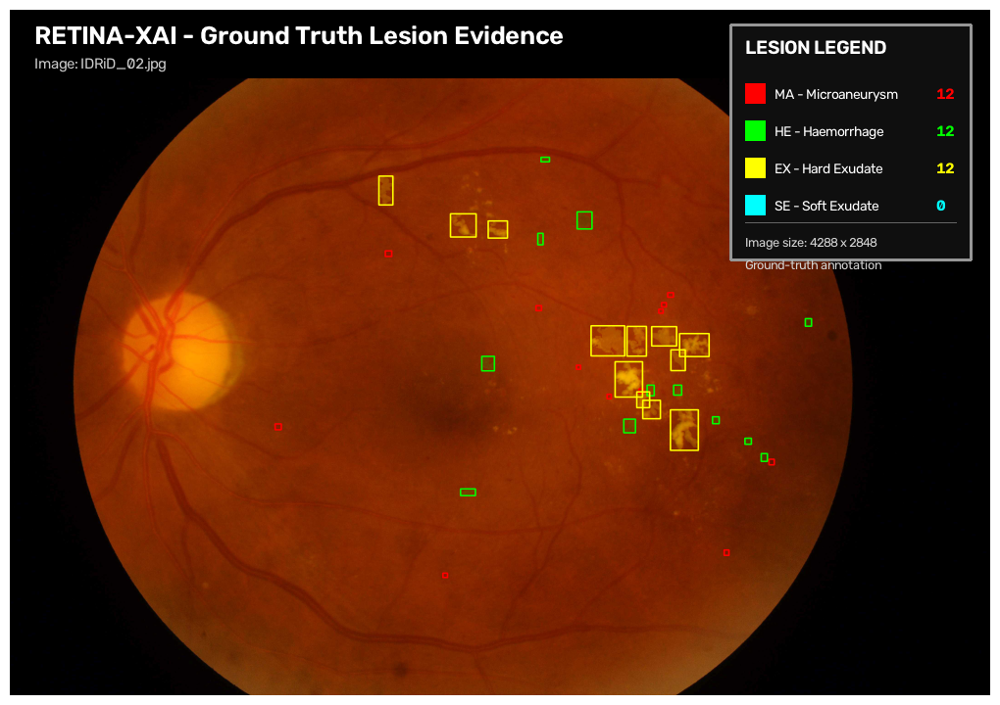


RETINA-XAI LESION EVIDENCE
MA  : 12 regions
HE  : 12 regions
EX  : 12 regions
SE  : 0 regions

Output size:
1000 × 700

JPG:
C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening\deep-learning\outputs\IDRiD_02_clean_lesion_evidence.jpg

SVG:
C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening\deep-learning\outputs\IDRiD_02_clean_lesion_evidence.svg


In [57]:
# ============================================================
# RETINA-XAI
# CLEAN GROUND-TRUTH LESION EVIDENCE
# Retina clear + labels in TOP-RIGHT PANEL
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path


# ============================================================
# 1. PATHS
# ============================================================

ROOT = Path(
    r"C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening"
)

IMAGE_NAME = "IDRiD_02.jpg"
IMAGE_ID = IMAGE_NAME.replace(".jpg", "")

IMAGE_PATH = (
    ROOT
    / "Disease Dataset"
    / "A. Segmentation"
    / "1. Original Images"
    / "a. Training Set"
    / IMAGE_NAME
)

MASK_ROOT = (
    ROOT
    / "Disease Dataset"
    / "A. Segmentation"
    / "2. All Segmentation Groundtruths"
    / "a. Training Set"
)

OUTPUT_DIR = (
    ROOT
    / "deep-learning"
    / "outputs"
)

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


# ============================================================
# 2. FINAL IMAGE SIZE
# ============================================================

FINAL_WIDTH = 1000
FINAL_HEIGHT = 700

HEADER_HEIGHT = 70


# ============================================================
# 3. LOAD ORIGINAL RETINA
# ============================================================

image_bgr = cv2.imread(
    str(IMAGE_PATH)
)

if image_bgr is None:
    raise FileNotFoundError(
        f"Image not found:\n{IMAGE_PATH}"
    )

image_rgb = cv2.cvtColor(
    image_bgr,
    cv2.COLOR_BGR2RGB
)

H, W = image_rgb.shape[:2]

print(
    f"Original image: {W} × {H}"
)


# ============================================================
# 4. LESION DEFINITIONS
# ============================================================

LESIONS = {

    1: {
        "short": "MA",
        "name": "Microaneurysm",
        "color": (255, 0, 0),
        "min_area": 15
    },

    2: {
        "short": "HE",
        "name": "Haemorrhage",
        "color": (0, 255, 0),
        "min_area": 30
    },

    3: {
        "short": "EX",
        "name": "Hard Exudate",
        "color": (255, 255, 0),
        "min_area": 30
    },

    4: {
        "short": "SE",
        "name": "Soft Exudate",
        "color": (0, 255, 255),
        "min_area": 30
    }
}


# ============================================================
# 5. MASK PATHS
# ============================================================

MASK_PATHS = {

    1:
        MASK_ROOT
        / "1. Microaneurysms"
        / f"{IMAGE_ID}_MA.tif",

    2:
        MASK_ROOT
        / "2. Haemorrhages"
        / f"{IMAGE_ID}_HE.tif",

    3:
        MASK_ROOT
        / "3. Hard Exudates"
        / f"{IMAGE_ID}_EX.tif",

    4:
        MASK_ROOT
        / "4. Soft Exudates"
        / f"{IMAGE_ID}_SE.tif"
}


# ============================================================
# 6. CREATE RESULT
# ============================================================

result = image_rgb.copy()

detection_counts = {}

all_regions = []


# ============================================================
# 7. PROCESS EACH MASK
# ============================================================

for class_id, info in LESIONS.items():

    short = info["short"]
    name = info["name"]
    color = info["color"]

    mask_path = MASK_PATHS[class_id]

    # --------------------------------------------------------
    # Missing mask = no lesion
    # --------------------------------------------------------

    if not mask_path.exists():

        detection_counts[short] = 0

        print(
            f"No mask: {name}"
        )

        continue


    # --------------------------------------------------------
    # Read mask
    # --------------------------------------------------------

    mask = cv2.imread(
        str(mask_path),
        cv2.IMREAD_GRAYSCALE
    )

    if mask is None:

        detection_counts[short] = 0

        continue


    # --------------------------------------------------------
    # Ensure same size
    # --------------------------------------------------------

    if mask.shape != (H, W):

        mask = cv2.resize(
            mask,
            (W, H),
            interpolation=cv2.INTER_NEAREST
        )


    binary = np.uint8(
        mask > 0
    ) * 255


    # --------------------------------------------------------
    # Remove tiny noise
    # --------------------------------------------------------

    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (3, 3)
    )

    binary = cv2.morphologyEx(
        binary,
        cv2.MORPH_OPEN,
        kernel
    )


    # --------------------------------------------------------
    # Connected components
    # --------------------------------------------------------

    num_labels, labels, stats, centroids = \
        cv2.connectedComponentsWithStats(
            binary,
            connectivity=8
        )


    regions = []

    for i in range(1, num_labels):

        area = stats[
            i,
            cv2.CC_STAT_AREA
        ]

        if area < info["min_area"]:
            continue

        x = stats[
            i,
            cv2.CC_STAT_LEFT
        ]

        y = stats[
            i,
            cv2.CC_STAT_TOP
        ]

        w = stats[
            i,
            cv2.CC_STAT_WIDTH
        ]

        h = stats[
            i,
            cv2.CC_STAT_HEIGHT
        ]

        regions.append({
            "class_id": class_id,
            "short": short,
            "name": name,
            "color": color,
            "area": area,
            "x": x,
            "y": y,
            "w": w,
            "h": h,
            "component_id": i,
            "labels": labels
        })


    # --------------------------------------------------------
    # Sort biggest first
    # --------------------------------------------------------

    regions.sort(
        key=lambda r: r["area"],
        reverse=True
    )


    # --------------------------------------------------------
    # Keep reasonable number
    # --------------------------------------------------------

    MAX_REGIONS = 12

    regions = regions[:MAX_REGIONS]

    detection_counts[short] = len(regions)

    all_regions.extend(regions)


# ============================================================
# 8. DRAW LESION BOXES
# ============================================================

for r in all_regions:

    x = r["x"]
    y = r["y"]
    w = r["w"]
    h = r["h"]

    color = r["color"]

    labels = r["labels"]
    component_id = r["component_id"]


    # --------------------------------------------------------
    # Highlight lesion itself
    # --------------------------------------------------------

    component = np.uint8(
        labels == component_id
    )

    overlay = result.copy()

    overlay[
        component > 0
    ] = color

    result = cv2.addWeighted(
        result,
        0.88,
        overlay,
        0.12,
        0
    )


    # --------------------------------------------------------
    # Clean bounding box
    # --------------------------------------------------------

    cv2.rectangle(
        result,
        (x, y),
        (x + w, y + h),
        color,
        6
    )


# ============================================================
# 9. RESIZE RETINA
# ============================================================

RETINA_WIDTH = FINAL_WIDTH
RETINA_HEIGHT = FINAL_HEIGHT - HEADER_HEIGHT

display = cv2.resize(
    result,
    (
        RETINA_WIDTH,
        RETINA_HEIGHT
    ),
    interpolation=cv2.INTER_AREA
)


# ============================================================
# 10. CREATE BLACK CANVAS
# ============================================================

canvas = np.zeros(
    (
        FINAL_HEIGHT,
        FINAL_WIDTH,
        3
    ),
    dtype=np.uint8
)


# ============================================================
# 11. HEADER
# ============================================================

cv2.putText(
    canvas,
    "RETINA-XAI - Ground Truth Lesion Evidence",
    (25, 35),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.9,
    (255, 255, 255),
    2,
    cv2.LINE_AA
)

cv2.putText(
    canvas,
    f"Image: {IMAGE_NAME}",
    (25, 60),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.5,
    (200, 200, 200),
    1,
    cv2.LINE_AA
)


# ============================================================
# 12. PUT RETINA ON CANVAS
# ============================================================

canvas[
    HEADER_HEIGHT:
] = display


# ============================================================
# 13. TOP-RIGHT INFORMATION PANEL
# ============================================================

PANEL_X1 = 735
PANEL_Y1 = 15
PANEL_X2 = 980
PANEL_Y2 = 255


# Dark panel
cv2.rectangle(
    canvas,
    (PANEL_X1, PANEL_Y1),
    (PANEL_X2, PANEL_Y2),
    (15, 15, 15),
    -1
)


# Border
cv2.rectangle(
    canvas,
    (PANEL_X1, PANEL_Y1),
    (PANEL_X2, PANEL_Y2),
    (150, 150, 150),
    2
)


# ============================================================
# 14. PANEL TITLE
# ============================================================

cv2.putText(
    canvas,
    "LESION LEGEND",
    (PANEL_X1 + 15, PANEL_Y1 + 30),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.65,
    (255, 255, 255),
    2,
    cv2.LINE_AA
)


# ============================================================
# 15. LEGEND
# ============================================================

legend_y = PANEL_Y1 + 60

for class_id, info in LESIONS.items():

    color = info["color"]
    short = info["short"]
    name = info["name"]

    count = detection_counts.get(
        short,
        0
    )

    # Color square
    cv2.rectangle(
        canvas,
        (
            PANEL_X1 + 15,
            legend_y
        ),
        (
            PANEL_X1 + 35,
            legend_y + 20
        ),
        color,
        -1
    )

    # Text
    cv2.putText(
        canvas,
        f"{short} - {name}",
        (
            PANEL_X1 + 45,
            legend_y + 16
        ),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.48,
        (255, 255, 255),
        1,
        cv2.LINE_AA
    )

    # Count
    cv2.putText(
        canvas,
        str(count),
        (
            PANEL_X2 - 35,
            legend_y + 16
        ),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,
        color,
        2,
        cv2.LINE_AA
    )

    legend_y += 38


# ============================================================
# 16. IMAGE INFORMATION
# ============================================================

cv2.line(
    canvas,
    (
        PANEL_X1 + 15,
        legend_y - 10
    ),
    (
        PANEL_X2 - 15,
        legend_y - 10
    ),
    (100, 100, 100),
    1
)

cv2.putText(
    canvas,
    f"Image size: {W} x {H}",
    (
        PANEL_X1 + 15,
        legend_y + 15
    ),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.43,
    (210, 210, 210),
    1,
    cv2.LINE_AA
)

cv2.putText(
    canvas,
    "Ground-truth annotation",
    (
        PANEL_X1 + 15,
        legend_y + 38
    ),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.43,
    (210, 210, 210),
    1,
    cv2.LINE_AA
)


# ============================================================
# 17. SAVE JPG
# ============================================================

jpg_path = (
    OUTPUT_DIR
    / f"{IMAGE_ID}_clean_lesion_evidence.jpg"
)

cv2.imwrite(
    str(jpg_path),
    cv2.cvtColor(
        canvas,
        cv2.COLOR_RGB2BGR
    ),
    [
        cv2.IMWRITE_JPEG_QUALITY,
        95
    ]
)


# ============================================================
# 18. SAVE SVG
# ============================================================

svg_path = (
    OUTPUT_DIR
    / f"{IMAGE_ID}_clean_lesion_evidence.svg"
)

plt.figure(
    figsize=(10, 7),
    dpi=100
)

plt.imshow(canvas)

plt.axis("off")

plt.tight_layout(
    pad=0
)

plt.savefig(
    str(svg_path),
    format="svg",
    bbox_inches="tight",
    pad_inches=0
)

plt.close()


# ============================================================
# 19. DISPLAY
# ============================================================

plt.figure(
    figsize=(10, 7),
    dpi=100
)

plt.imshow(canvas)

plt.axis("off")

plt.tight_layout(
    pad=0
)

plt.show()


# ============================================================
# 20. SUMMARY
# ============================================================

print("\n======================================")
print("RETINA-XAI LESION EVIDENCE")
print("======================================")

for short, count in detection_counts.items():

    print(
        f"{short:3s} : {count} regions"
    )

print("\nOutput size:")
print(
    f"{FINAL_WIDTH} × {FINAL_HEIGHT}"
)

print("\nJPG:")
print(jpg_path)

print("\nSVG:")
print(svg_path)

In [58]:
from pathlib import Path
import torch

# Project model directory
model_dir = Path(
    r"C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening"
) / "deep-learning" / "models"

model_dir.mkdir(
    parents=True,
    exist_ok=True
)

# Save current V1 model
v1_path = model_dir / "retina_xai_unet_v1.pth"

torch.save(
    model.state_dict(),
    v1_path
)

print("✅ V1 U-Net saved successfully!")
print(v1_path)

✅ V1 U-Net saved successfully!
C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening\deep-learning\models\retina_xai_unet_v1.pth


In [59]:
from pathlib import Path

v1_path = Path(
    r"C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening"
) / "deep-learning" / "models" / "retina_xai_unet_v1.pth"

print("Exists:", v1_path.exists())
print("Path:", v1_path)

Exists: True
Path: C:\Users\vu241\OneDrive\Desktop\Diabetic-Retinopathy-Screening\deep-learning\models\retina_xai_unet_v1.pth
